# 12주차_생성 모델과 창작 

- 참고 자료
- Preview
- 확률적 생성 모델
- 오토인코더
- 생성 적대 신경망(GAN)
- 응용 시나리오: 인공지능 패션 디자인
- 생성 모델의 발전과 인공지능 창작

---

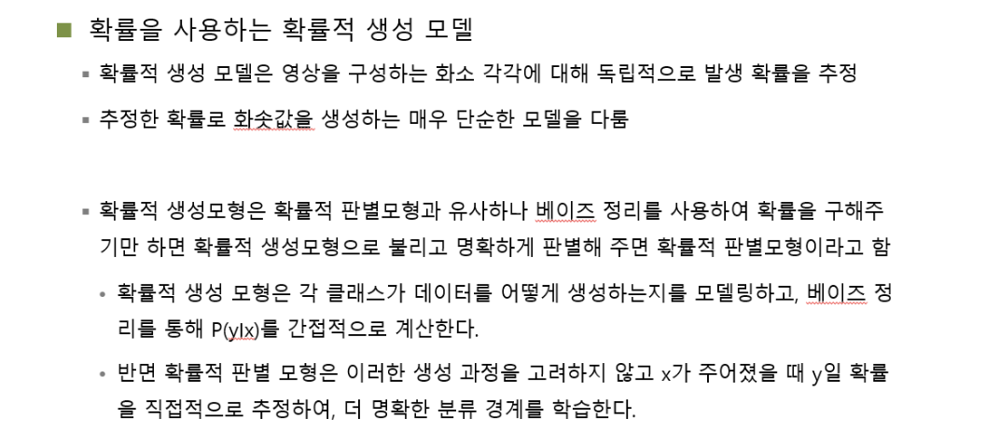

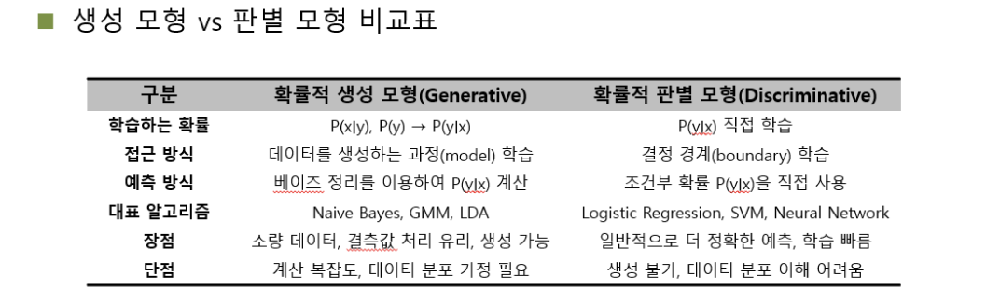

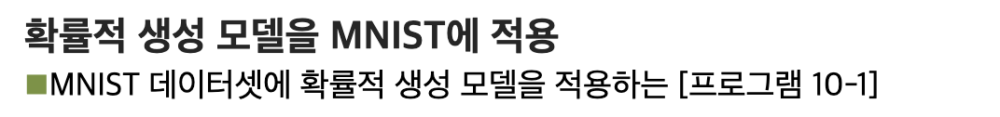

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 MNIST 데이터셋 중 '0' 클래스에 해당하는 이미지들만 추출하여,
# 각 화소 위치에 대한 픽셀값 분포를 기반으로 새로운 이미지를 확률적으로 생성하는 모델을 구성함.
# 특히 고전적인 확률 생성 모델(probabilistic generative model)의 아이디어를 활용하여,
# 단순한 통계 기반 생성 기법의 개념적 직관을 학습하는 데 목적이 있음.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: MNIST 데이터셋 로드 및 '0'에 해당하는 이미지 필터링
# 2단계: 각 픽셀 위치별로 0~255 값의 빈도를 계산하여 확률 분포 생성
# 3단계: 해당 확률 분포를 기반으로 새로운 샘플 20장을 무작위 생성
# 4단계: 생성된 샘플 이미지를 2행 10열로 시각화
# ------------------------------------------------------------

import numpy as np
# 수치 연산을 위한 핵심 라이브러리로, 배열 연산 및 조건 필터링, 샘플링 등에 사용됨

from tensorflow.keras.datasets import mnist
# Keras에서 제공하는 MNIST 손글씨 숫자 데이터셋 로딩 모듈
# (28x28 크기의 흑백 이미지로 구성된 총 70,000개 손글씨 숫자 데이터 포함)

# ------------------------------------------------------------
# [1단계] MNIST 데이터셋 로드 및 숫자 0에 해당하는 이미지 필터링
# ------------------------------------------------------------

(x_train, y_train), (x_test, y_test) = mnist.load_data()
# 전체 MNIST 데이터셋을 학습용과 테스트용으로 분리하여 로드함
# x_train: (60000, 28, 28) 형태의 손글씨 이미지 배열
# y_train: (60000,) 형태의 정수형 라벨 배열 (0~9)

X = x_train[np.isin(y_train, [0])]
# y_train 배열에서 숫자 0인 인덱스만 선택하여 해당하는 이미지(x_train)만 추출함
# 결과적으로 숫자 '0'에 해당하는 이미지 샘플만으로 구성된 새로운 배열 X 생성
# X.shape는 대략 (5923, 28, 28)로 예상됨

# ------------------------------------------------------------
# [2단계] 픽셀 위치별 값(0~255)에 대한 등장 횟수 기반 확률 생성 모델 구축
# ------------------------------------------------------------

P = np.zeros((28, 28, 256))
# 각 픽셀 위치(i,j)에서 발생 가능한 밝기값(0~255)에 대한 빈도수를 저장하기 위한 3차원 배열 생성
# P[i][j][v]: (i,j) 위치에서 픽셀값 v가 등장한 횟수를 기록함

for k in range(X.shape[0]):
    # 숫자 0에 해당하는 이미지 X의 모든 샘플에 대해 반복 수행함 (총 약 5923개)
    for i in range(X.shape[1]):
        # 이미지의 세로 방향 픽셀 인덱스 (0~27) 순회
        for j in range(X.shape[2]):
            # 이미지의 가로 방향 픽셀 인덱스 (0~27) 순회
            P[i][j][X[k][i][j]] += 1
            # (i,j) 위치의 픽셀에서 등장한 실제 픽셀값 X[k][i][j]에 해당하는 빈도수를 +1 증가시킴
            # 결국 각 위치에서 각 밝기값이 얼마나 자주 나타났는지를 기록하게 됨

P = P / X.shape[0]
# 총 등장 횟수를 이미지 개수로 나누어 각 픽셀 위치별 확률 분포로 변환함
# P[i][j][v]: (i,j) 위치의 픽셀이 값 v를 가질 확률

# ------------------------------------------------------------
# [3단계] 확률 분포 기반으로 새로운 이미지 20개 생성
# ------------------------------------------------------------

Xnew = np.zeros((20, 28, 28))
# 28x28 픽셀의 이미지 20개를 저장할 빈 배열을 생성함

for i in range(20):
    # 총 20장의 이미지를 생성하기 위해 반복 수행함
    for r in range(28):
        # 이미지의 세로축 픽셀 인덱스 순회
        for c in range(28):
            # 이미지의 가로축 픽셀 인덱스 순회
            Xnew[i][r][c] = np.random.choice(range(256), p=P[r][c])
            # (r,c) 위치에서 0~255 중 하나의 값을 확률 분포 P[r][c]에 따라 무작위로 샘플링하여 부여함
            # 각 위치별로 픽셀 밝기값을 독립적으로 샘플링함으로써 
            # 전체적인 형태는 유지하면서도 새로운 이미지를 생성할 수 있음

# ------------------------------------------------------------
# [4단계] 생성된 이미지 시각화
# ------------------------------------------------------------

import matplotlib.pyplot as plt
# 시각화를 위한 matplotlib 라이브러리 임포트

plt.figure(figsize=(20, 4))
# 전체 그림 크기를 가로 20인치, 세로 4인치로 설정함

for r in range(2):
    # 2행으로 구성된 subplot을 만들기 위한 반복문
    for c in range(10):
        # 각 행당 10개의 이미지 subplot을 배치함
        plt.subplot(2, 10, r * 10 + c + 1)
        # subplot 번호 지정하여 총 2x10 형태로 배치
        plt.imshow(Xnew[r * 10 + c], cmap='gray')
        # 각 이미지에 대해 grayscale로 시각화
        plt.xticks([]); plt.yticks([])
        # 축 눈금 제거로 이미지에 집중할 수 있도록 설정함

plt.show()
# 위에서 설정한 모든 subplot을 출력하여, 생성된 이미지 20장을 확인함


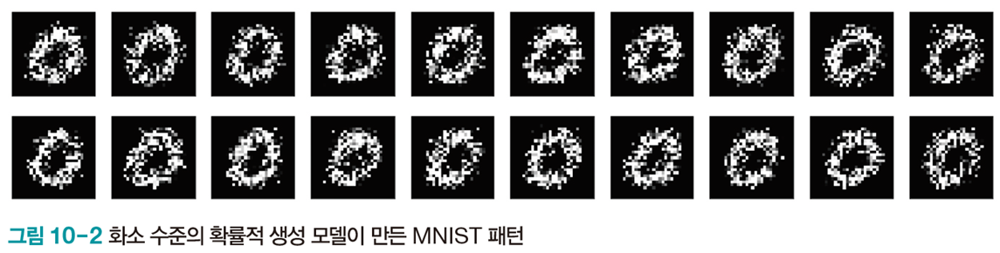

---

 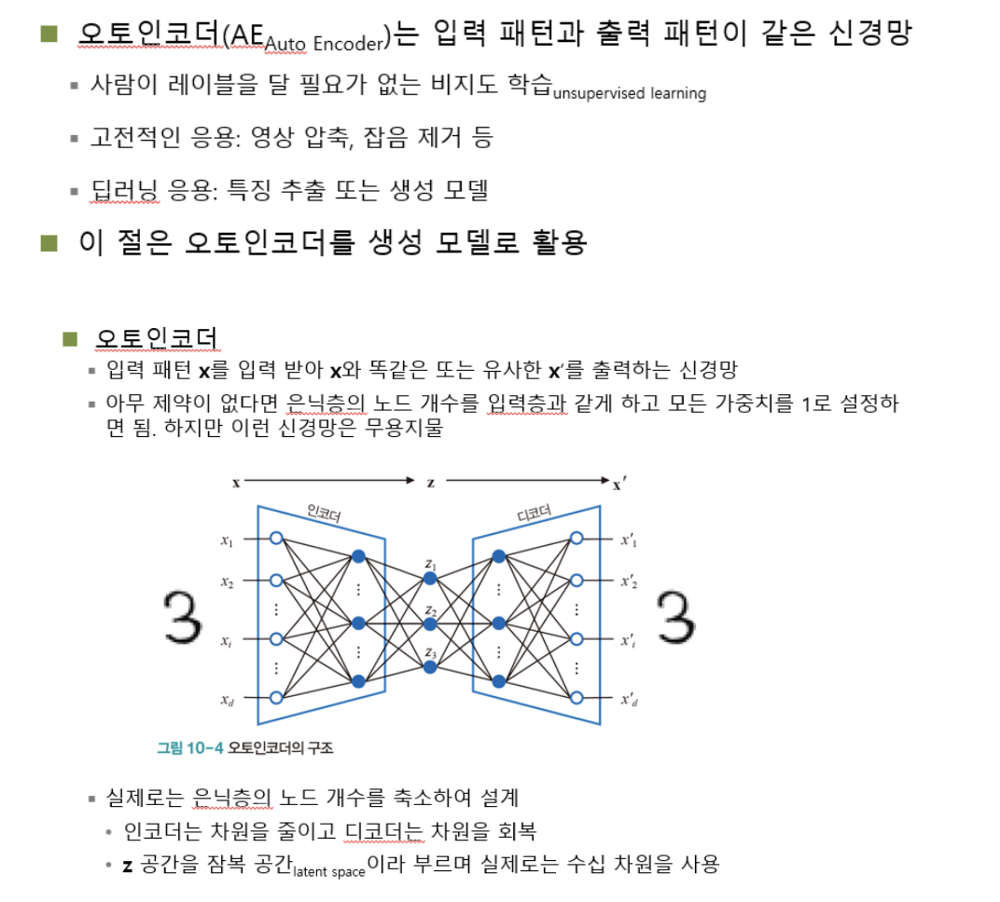

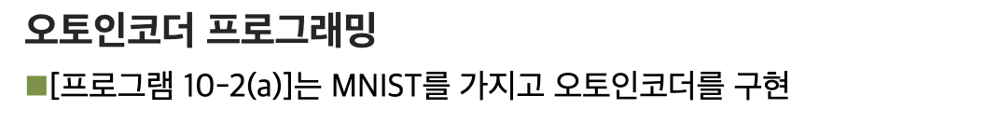

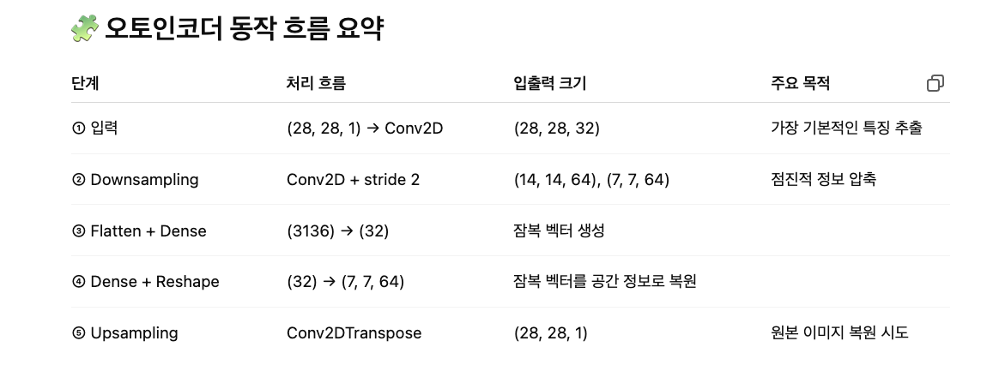

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 MNIST 손글씨 숫자 이미지(28x28)를 입력으로 받아 압축(latent representation)하고,
# 다시 복원하는 오토인코더(Autoencoder)를 CNN 기반으로 설계하고 학습하는 실험을 수행함.
# 특히 인코더는 입력 이미지를 점차 축소하여 잠복 공간(zdim)으로 압축하며,
# 디코더는 해당 벡터를 기반으로 원본 이미지를 복원하는 구조로 구성됨.
# 복원된 이미지와 원본 이미지를 비교하여 오토인코더의 재구성 성능을 시각적으로 평가함.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: MNIST 데이터셋 로드 및 정규화 및 차원 재정렬
# 2단계: 인코더 설계 (Conv → Flatten → Dense → 잠복 벡터)
# 3단계: 디코더 설계 (Dense → Reshape → ConvTranspose)
# 4단계: 인코더와 디코더를 연결하여 전체 오토인코더 구성
# 5단계: 오토인코더 학습 (입력과 출력 동일)
# 6단계: 테스트 이미지 복원 및 시각화
# ------------------------------------------------------------

import numpy as np  
# 배열 기반 수치 계산을 위한 핵심 라이브러리

from tensorflow.keras.datasets import mnist  
# MNIST 이미지 데이터셋 로드용 모듈

from tensorflow.keras.layers import Input, Dense, Flatten, Reshape, Conv2D, Conv2DTranspose  
# 입력, 완전 연결, 형태 변환, 합성곱 및 전치합성곱 레이어 등 신경망 구성 요소들

from tensorflow.keras.models import Model  
# 함수형 API 기반 모델 생성을 위한 클래스

from tensorflow.keras import backend as K  
# 텐서플로우 백엔드를 활용한 저수준 연산 처리 인터페이스

# ------------------------------------------------------------
# [1단계] MNIST 데이터셋 로드 및 전처리
# ------------------------------------------------------------

(x_train, y_train), (x_test, y_test) = mnist.load_data()  
# MNIST 학습 및 테스트 데이터셋 로드, 각 이미지 크기는 (28, 28)

x_train = x_train.astype('float32') / 255.  
# 픽셀 값을 0~1 범위로 정규화하여 안정적인 학습 유도

x_test = x_test.astype('float32') / 255.  
# 테스트셋도 동일하게 정규화하여 학습/검증 일관성 유지

x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  
# CNN 입력 형태(Height, Width, Channel)로 차원 재배열, 학습 데이터

x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  
# 테스트 데이터도 동일하게 (28,28,1) 구조로 reshape 수행

zdim = 32  # 잠복 공간(latent space)의 차원 수 설정

# ------------------------------------------------------------
# [2단계] 인코더 설계
# ------------------------------------------------------------

encoder_input = Input(shape=(28, 28, 1))  
# 인코더 입력 정의, MNIST 이미지 크기와 동일한 형상

x = Conv2D(32, (3, 3), activation='relu', padding='same', strides=(1, 1))(encoder_input)  
# 첫 합성곱 계층: 32개의 3x3 필터로 기본적 패턴 추출 수행

x = Conv2D(64, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 다운샘플링 포함 합성곱: 크기를 줄이며 더 복잡한 특징 추출

x = Conv2D(64, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 다시 한번 다운샘플링을 포함한 합성곱 계층 추가

x = Conv2D(64, (3, 3), activation='relu', padding='same', strides=(1, 1))(x)  
# 특징 유지한 채 표현력 증가 목적의 합성곱 적용

x = Flatten()(x)  
# 다차원 피처맵을 1차원 벡터로 변환하여 완전 연결층 입력 준비

encoder_output = Dense(zdim)(x)  
# 잠복 공간으로 압축하는 완전 연결 계층 (zdim=32)

model_encoder = Model(encoder_input, encoder_output)  
# 입력과 출력 정의를 바탕으로 인코더 모델 객체 생성

model_encoder.summary()  
# 인코더 구조 요약 출력

# ------------------------------------------------------------
# [3단계] 디코더 설계
# ------------------------------------------------------------

decoder_input = Input(shape=(zdim,))  
# 디코더 입력: 잠복 공간 벡터 (크기 32)

x = Dense(3136)(decoder_input)  
# 복원 시작을 위한 완전 연결 계층 (7x7x64 = 3136)

x = Reshape((7, 7, 64))(x)  
# 3136 벡터를 다시 3D 텐서로 변환 (7x7 feature map)

x = Conv2DTranspose(64, (3, 3), activation='relu', padding='same', strides=(1, 1))(x)  
# 전치합성곱을 통해 점진적 업샘플링 시작

x = Conv2DTranspose(64, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 크기 증가 및 패턴 복원 수행

x = Conv2DTranspose(32, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 추가 업샘플링으로 원본 크기 복원에 근접

x = Conv2DTranspose(1, (3, 3), activation='relu', padding='same', strides=(1, 1))(x)  
# 최종 출력층: 1채널 이미지 복원을 위한 전치합성곱

decoder_output = x  # 디코더 최종 출력 설정

model_decoder = Model(decoder_input, decoder_output)  
# 디코더 모델 객체 생성

model_decoder.summary()  
# 디코더 구조 요약 출력

# ------------------------------------------------------------
# [4단계] 전체 오토인코더 모델 구성
# ------------------------------------------------------------

model_input = encoder_input  
# 전체 모델의 입력은 인코더 입력과 동일

model_output = model_decoder(encoder_output)  
# 전체 모델의 출력은 디코더의 결과이며 인코더의 출력(zdim)을 입력으로 사용

model = Model(model_input, model_output)  
# 인코더와 디코더를 연결한 전체 오토인코더 모델 생성

# ------------------------------------------------------------
# [5단계] 모델 컴파일 및 학습 수행
# ------------------------------------------------------------

model.compile(optimizer='Adam', loss='mse')  
# 옵티마이저는 Adam, 손실 함수는 원본과의 차이를 측정하는 MSE 사용

model.fit(
    x_train, x_train, epochs=5, batch_size=128, shuffle=True, validation_data=(x_test, x_test)
    )  
# 입력과 출력을 동일하게 하여 복원 학습 수행
# 총 5 에폭 동안 128개 단위로 학습, 테스트셋으로 검증 수행

# 입력 = x_train, 출력(target) = x_train → 오토인코더의 기본 학습 형태
# 검증 입력 = x_test, 검증 출력 = x_test → 복원된 이미지의 품질을 테스트 데이터셋 기준으로 평가

# ------------------------------------------------------------
# [6단계] 복원 성능 평가 및 시각화
# ------------------------------------------------------------

decoded_img = model.predict(x_test)  
# 테스트 이미지에 대해 오토인코더를 적용하여 복원 결과 생성

import matplotlib.pyplot as plt  # 시각화 라이브러리 임포트

n = 10  # 비교할 이미지 수 설정

plt.figure(figsize=(20, 4))  # 출력 이미지 크기 설정

for i in range(n):
    plt.subplot(2, n, i + 1)  
    # 첫 줄: 원본 이미지 출력용 subplot
    plt.imshow(x_test[i].reshape(28, 28), cmap='gray')  
    # 회색조로 원본 이미지 출력
    plt.xticks([]); plt.yticks([])  
    # 축 눈금 제거로 깔끔한 출력 유도

    plt.subplot(2, n, i + n + 1)  
    # 두 번째 줄: 복원된 이미지 출력용 subplot
    plt.imshow(decoded_img[i].reshape(28, 28), cmap='gray')  
    # 복원 이미지 출력
    plt.xticks([]); plt.yticks([])

plt.show()  
# 전체 2행 10열 구조로 원본/복원 이미지를 한 화면에 출력


In [ ]:
# 인코더 모델 요약================================================================================

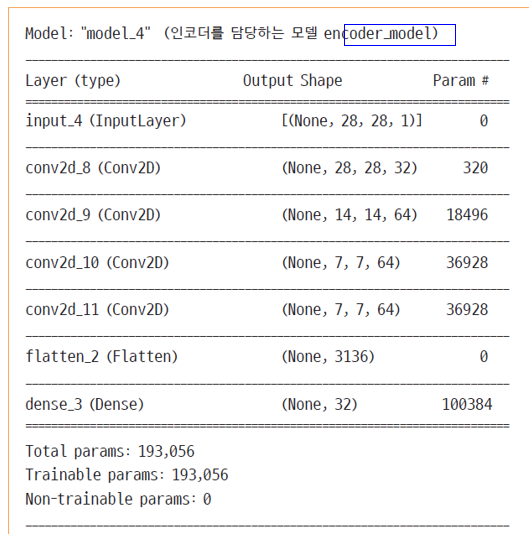

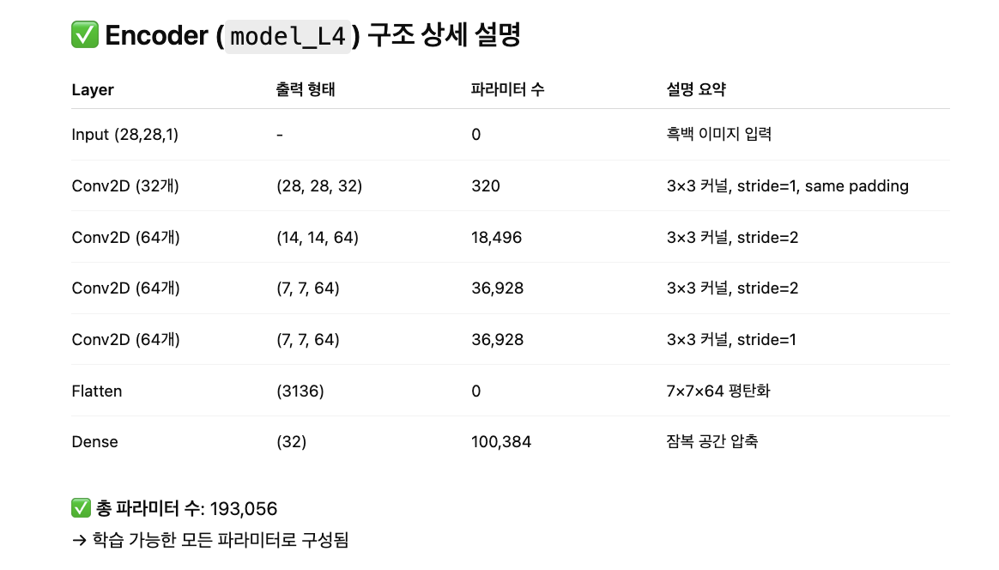

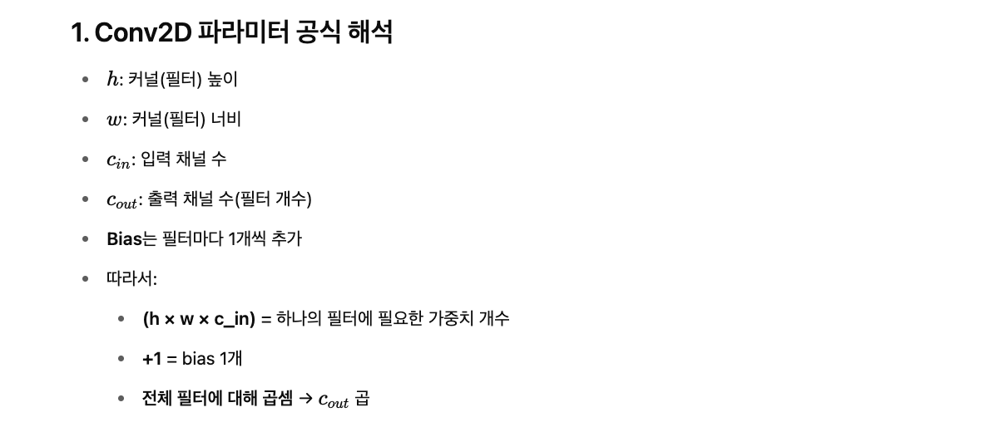

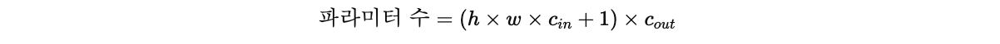

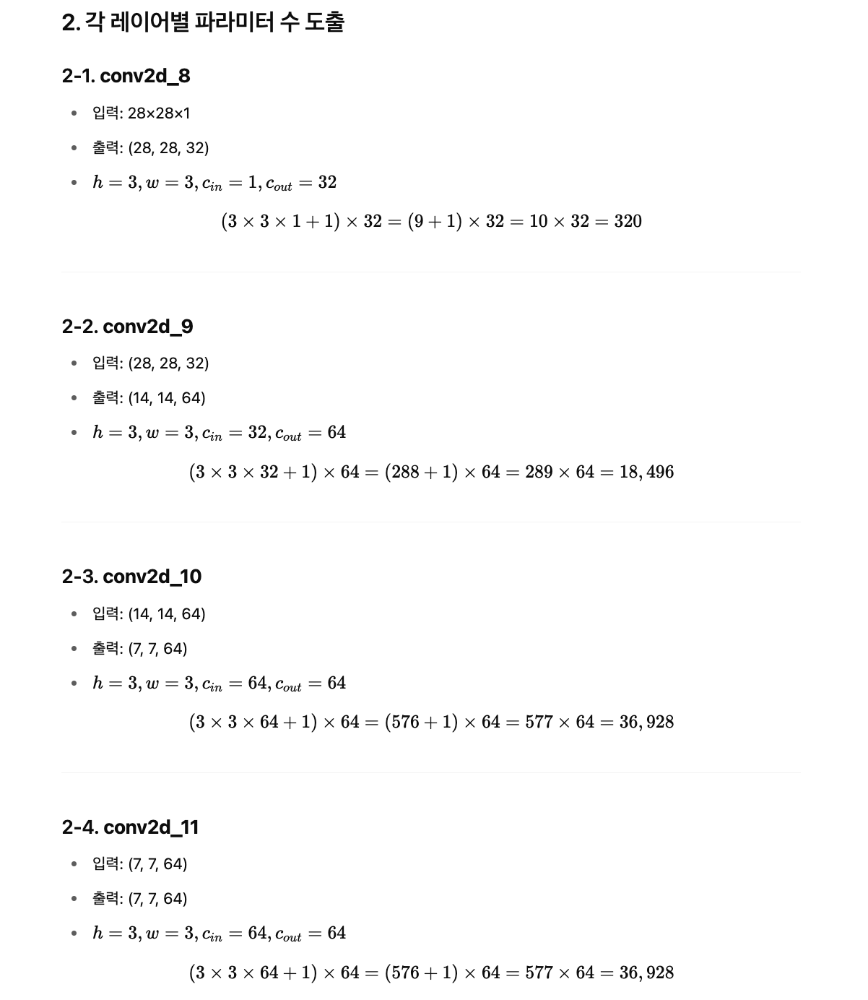

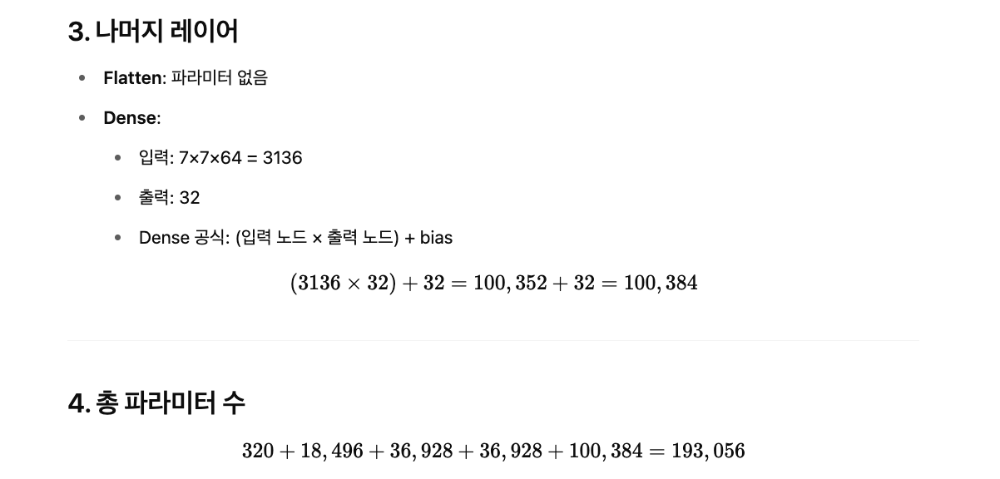

In [ ]:
# 디코더 모델 요약================================================================================

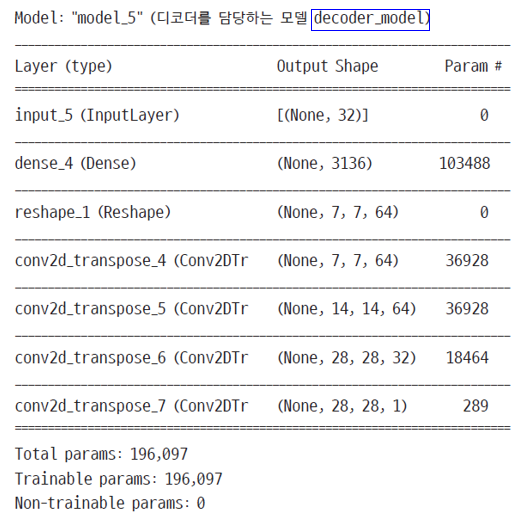

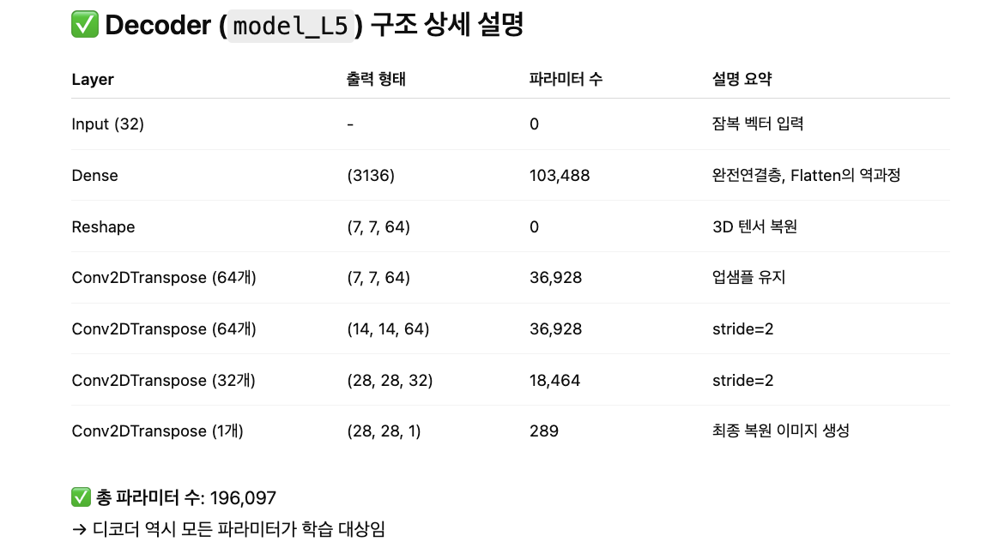

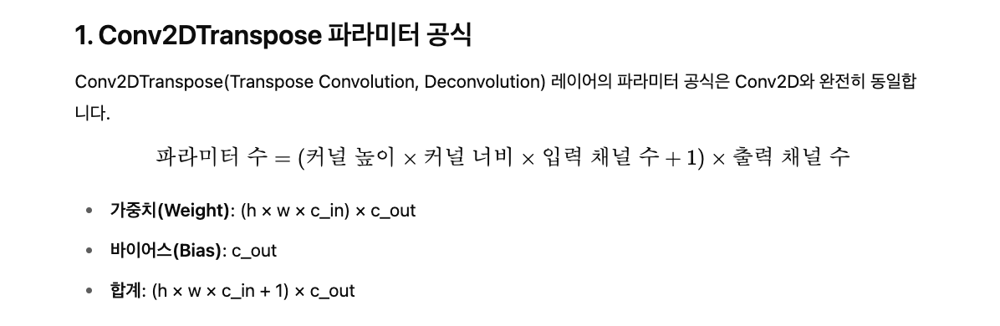

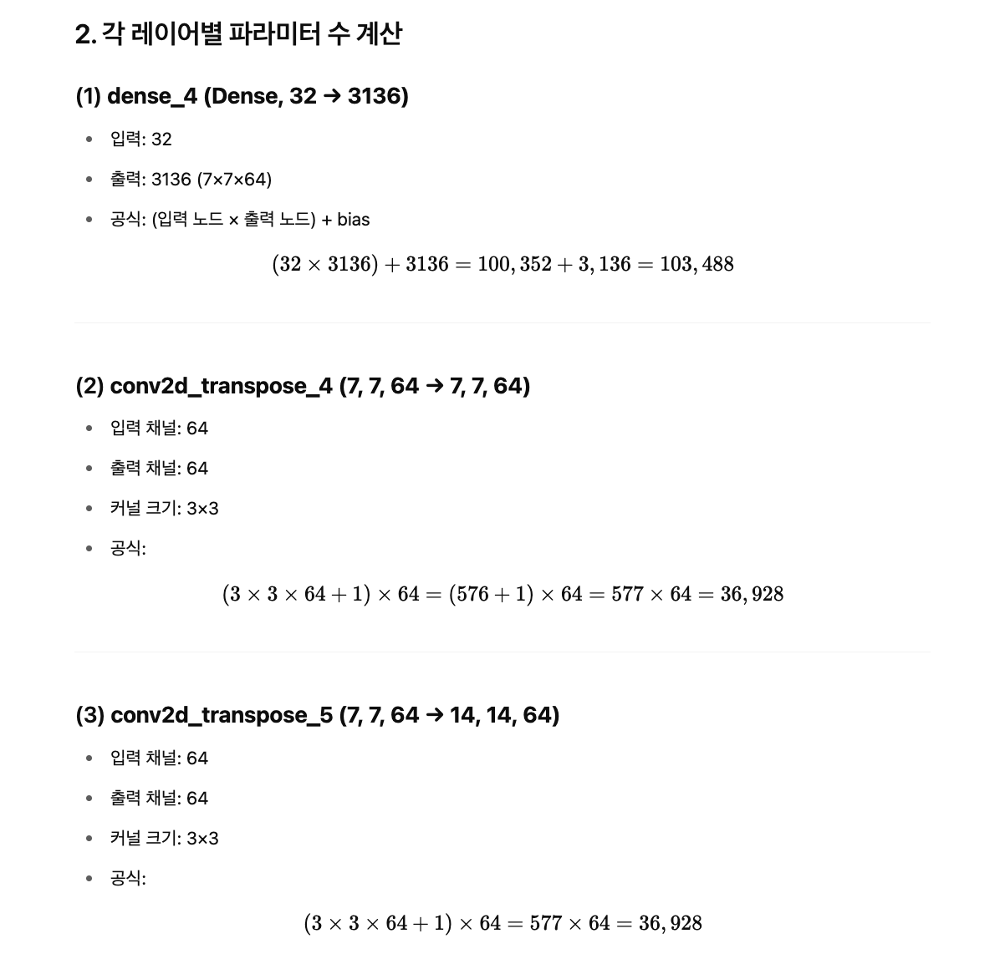

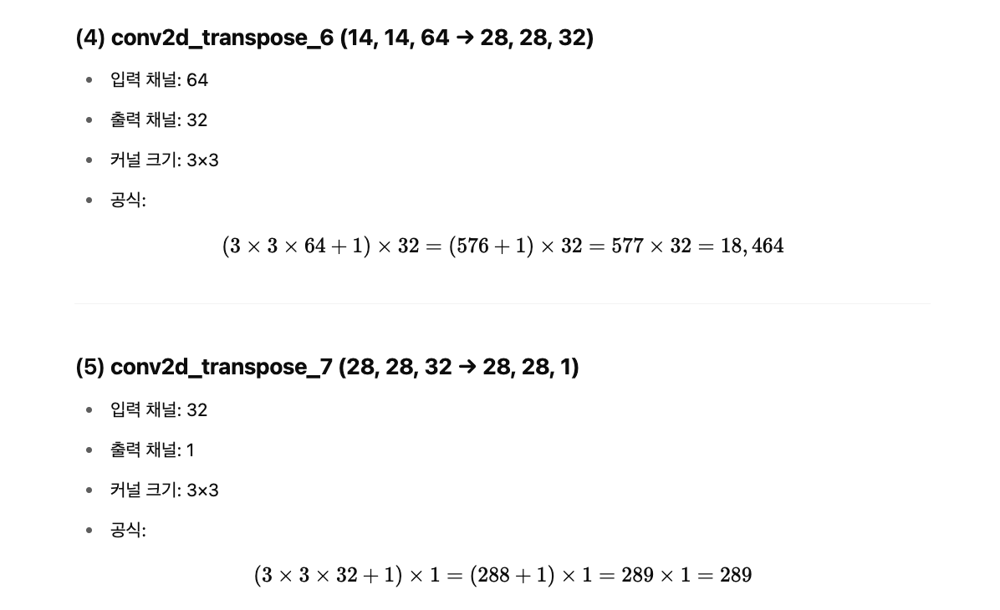

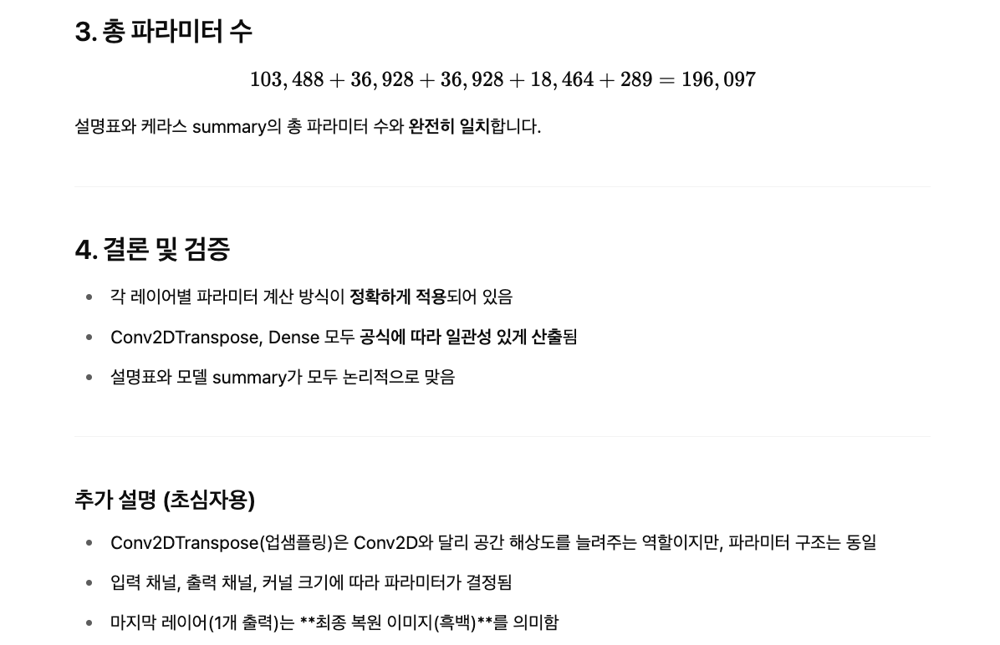

In [ ]:
# 오토인코더 전체 요약 ================================================================================

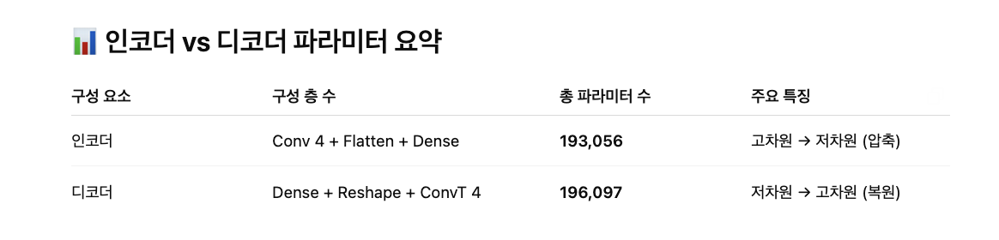

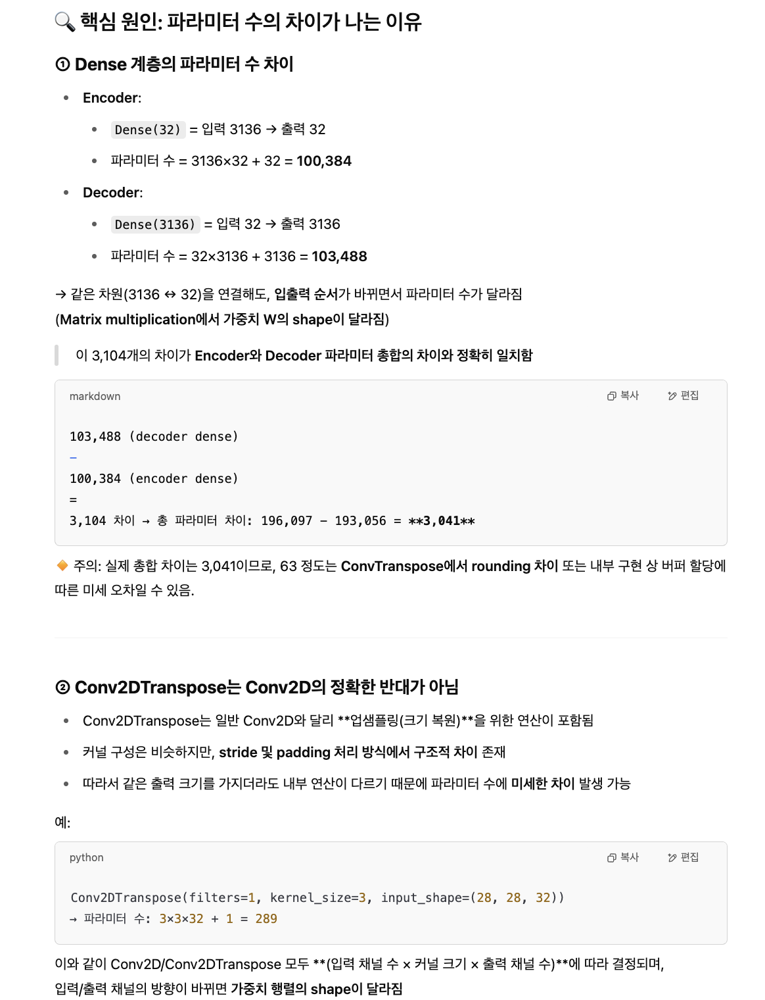

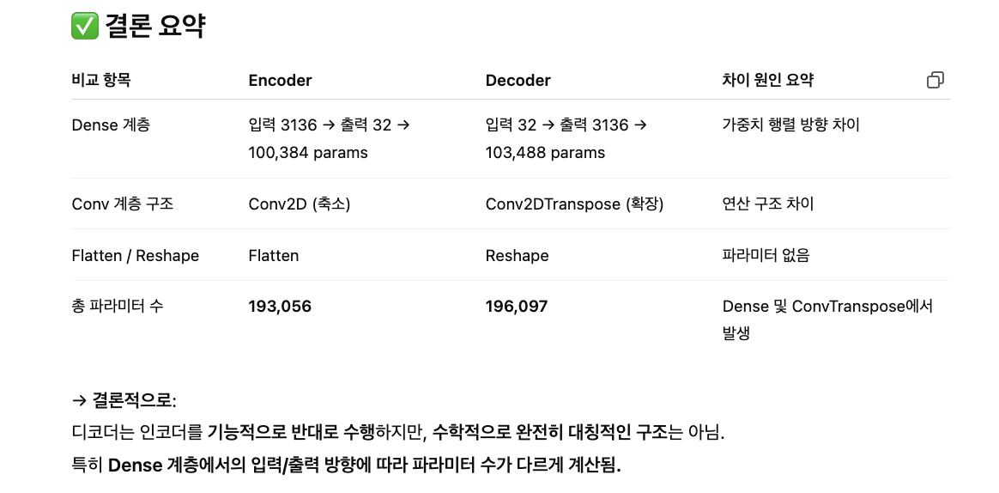

In [ ]:
# 코드 결과 ================================================================================

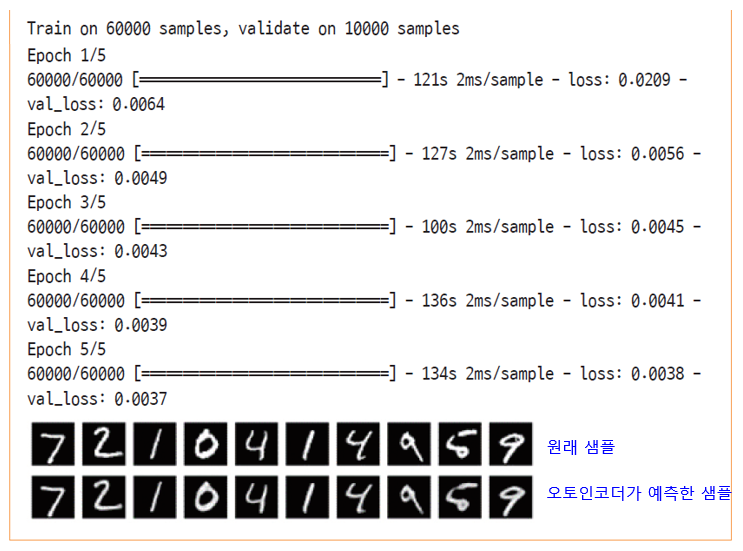

In [ ]:
# 오토인코더의 빌딩 블록 구조와 parameter 값 연습(인코더) ================================================================================

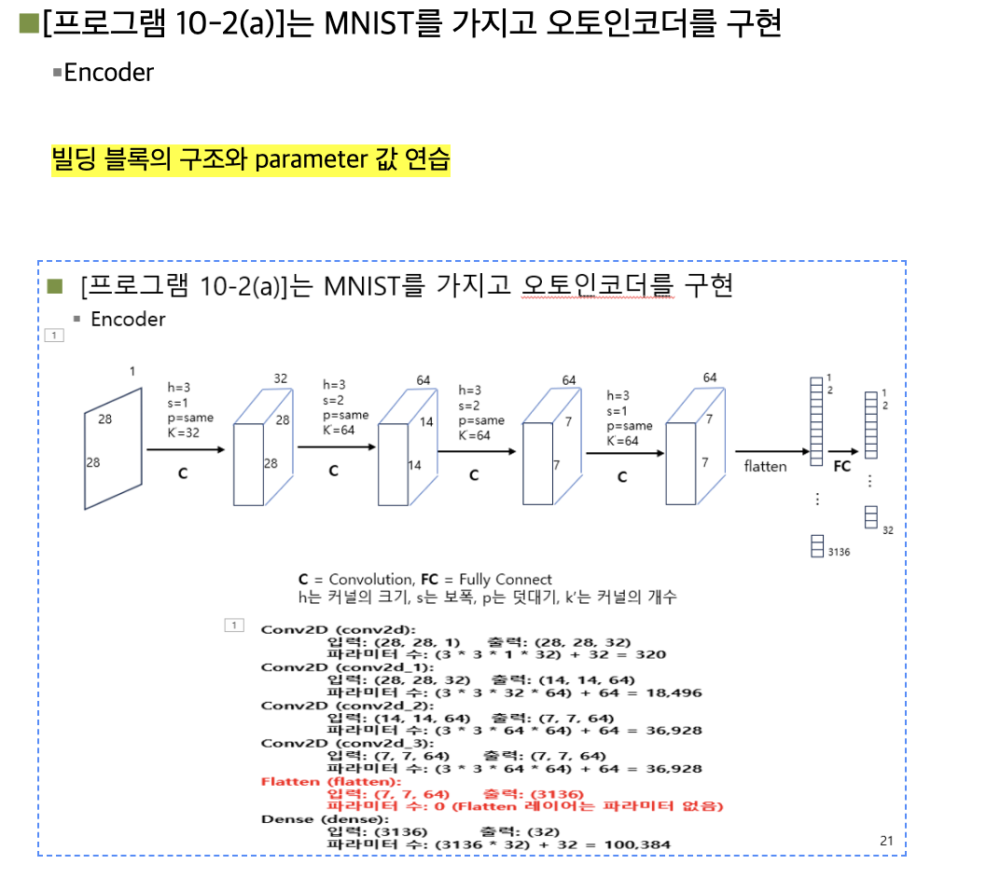
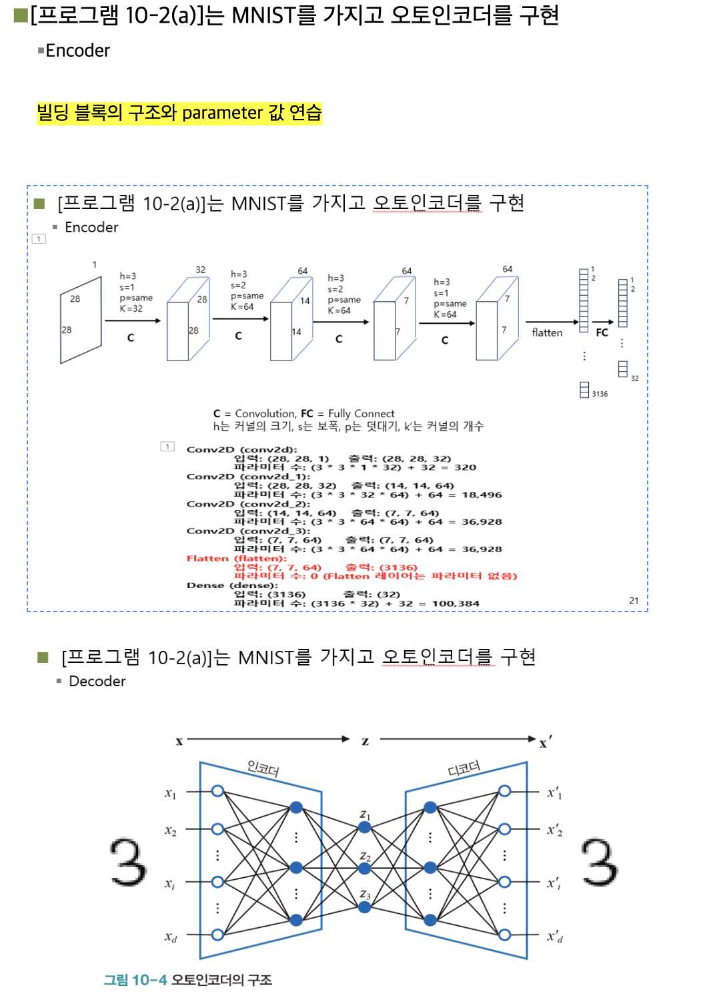

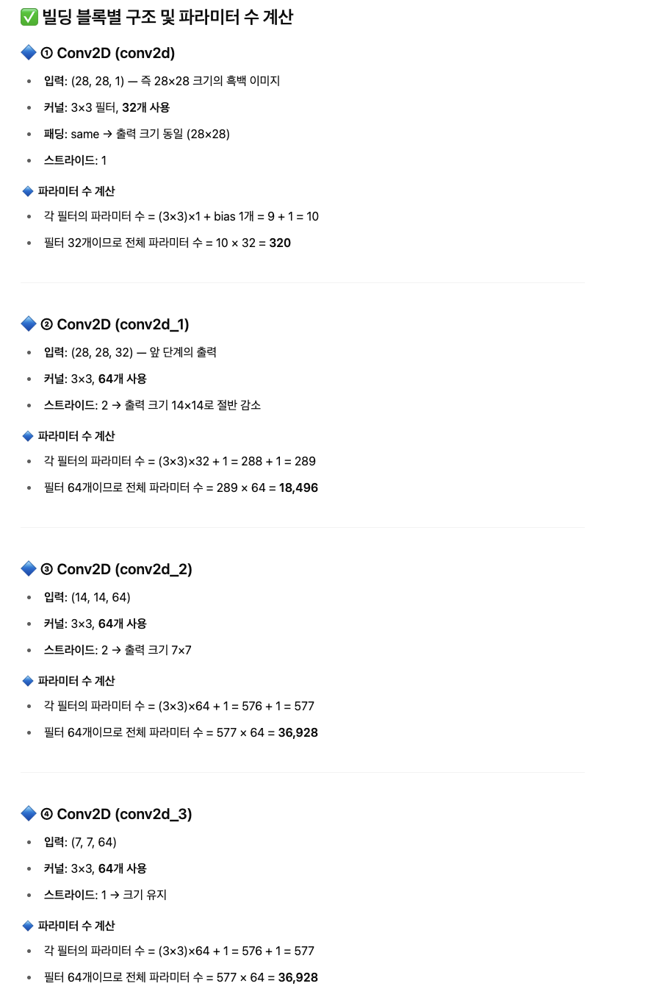

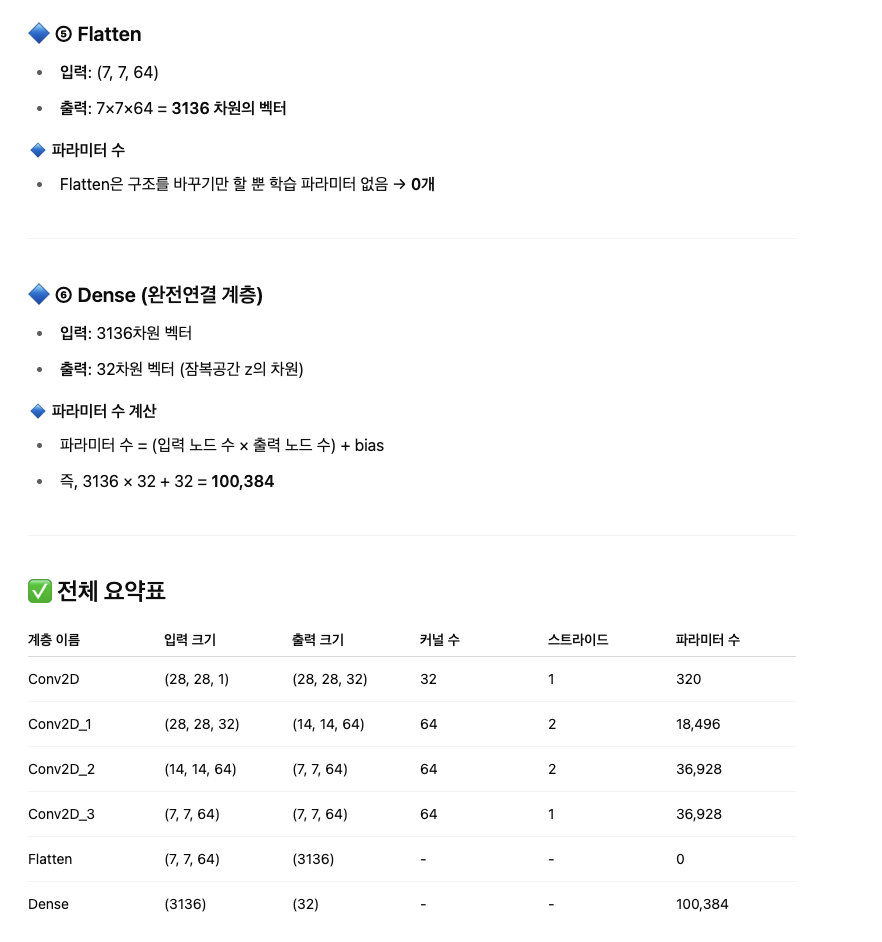

In [ ]:
# 오토인코더의 빌딩 블록 구조와 parameter 값 연습(디코더) ================================================================================

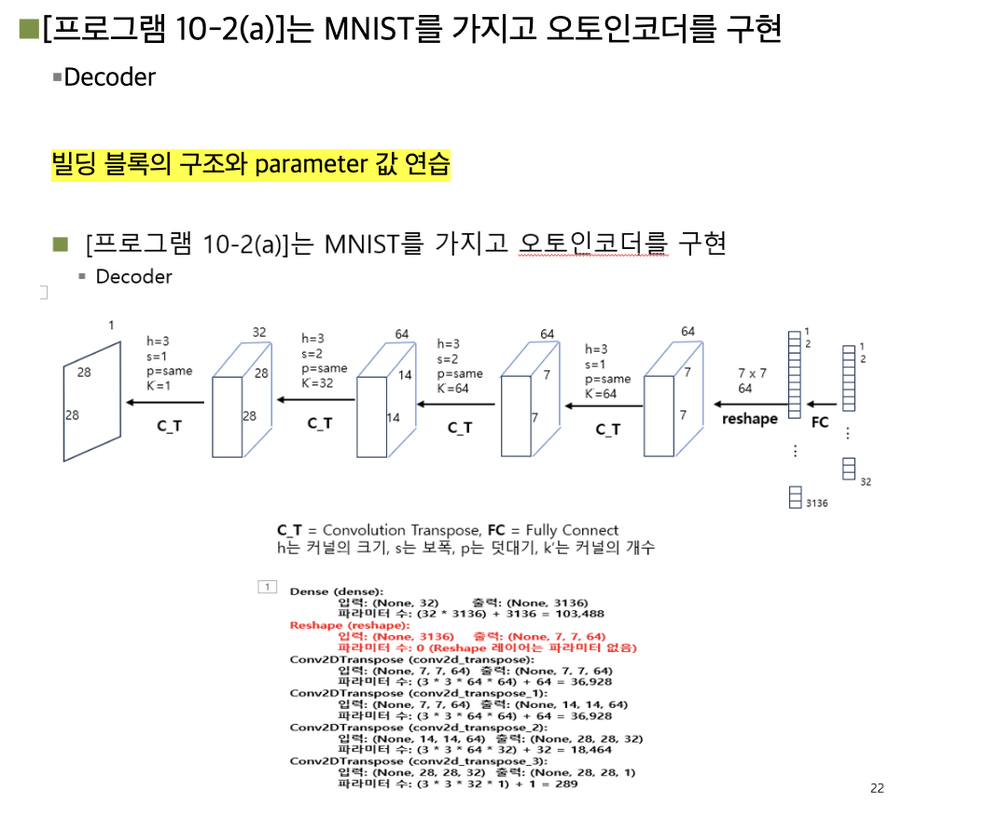

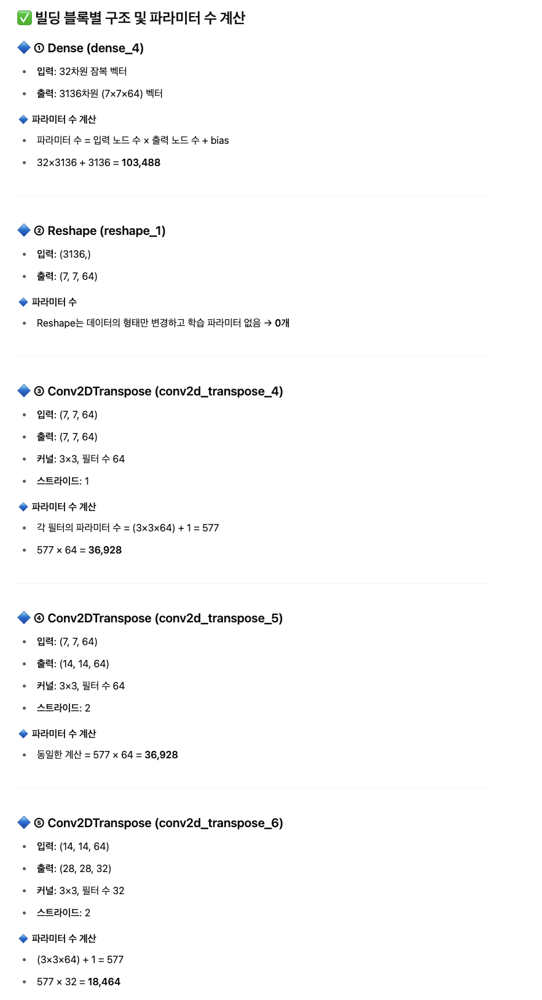

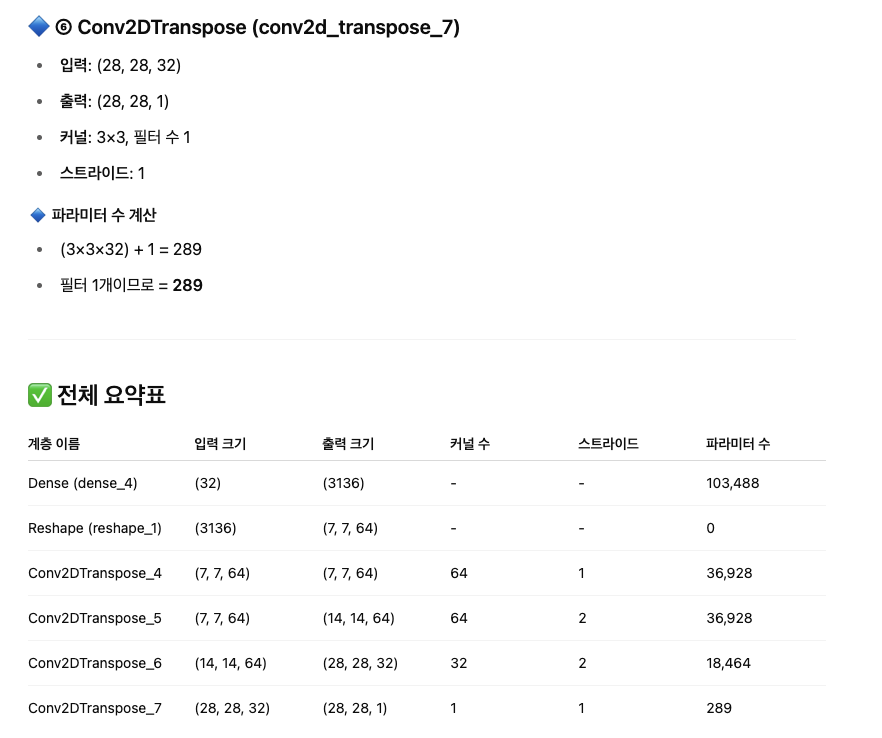

In [ ]:
# Conv & Dense 파라미터 공식 ================================================================================

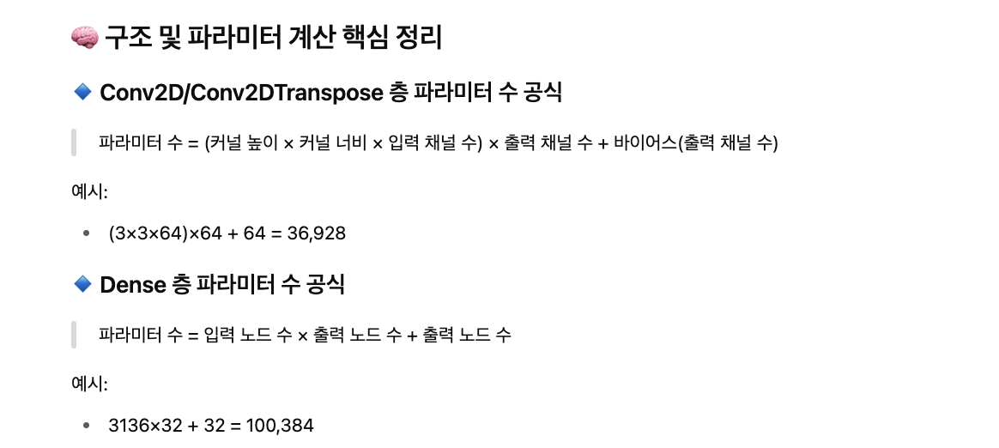

---

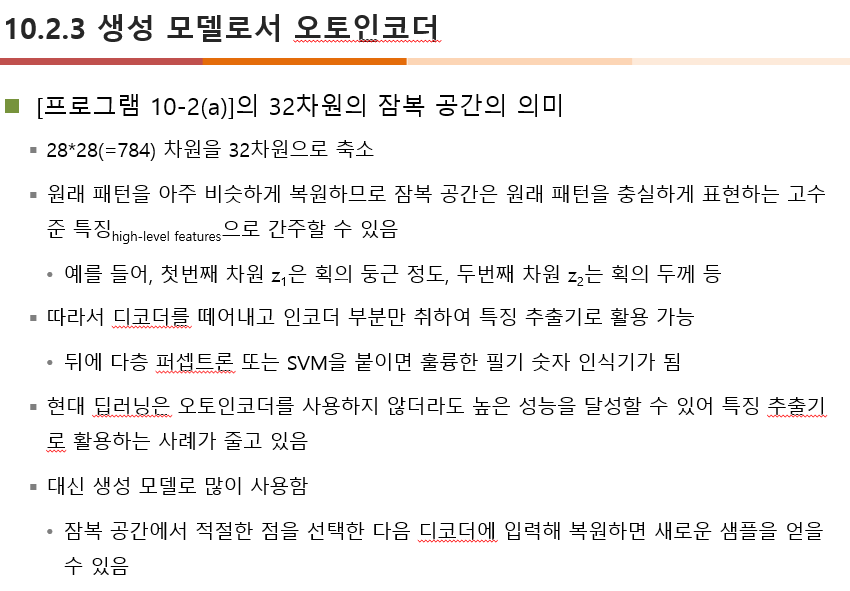

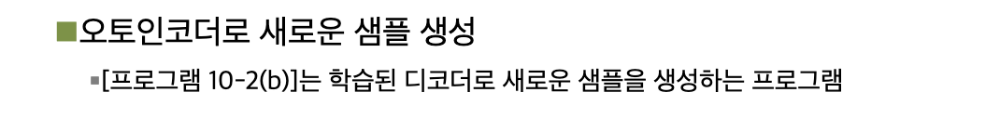

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 학습된 오토인코더의 잠복 공간(latent space)을 활용하여,
# 1) 하나의 샘플로부터 잡음을 섞어 변형된 이미지 생성,
# 2) 두 샘플 사이를 선형 보간하여 중간 이미지를 생성하는 실험을 수행함.
# 이를 통해 잠복 공간이 연속적이고 의미 있는 특성 공간으로 학습되었는지를 시각적으로 확인할 수 있음.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: 첫 번째 이미지의 잠복 벡터를 기준으로 다양한 잡음 노이즈를 섞어 이미지 생성
# 2단계: 두 개의 샘플을 선택하여 잠복 공간에서 선형 보간 후 복원 이미지 생성
# 3단계: 각 실험 결과를 2행 10열의 subplot으로 시각화
# ------------------------------------------------------------

# ------------------------------------------------------------
# 생성 실험 1: 첫 번째 샘플의 잠복 공간 표현에 잡음을 섞어 새로운 샘플 생성
# ------------------------------------------------------------

x0 = x_test[0]  
# 테스트셋에서 첫 번째 이미지를 선택하여 실험 대상으로 설정함

z = model_encoder.predict(x0.reshape(1, 28, 28, 1))  
# 선택한 이미지를 인코더에 통과시켜 잠복 공간 표현(latent vector)을 획득함
# 입력 차원을 (1, 28, 28, 1)로 변형하여 배치 처리 형태에 맞춤

print(np.round(z, 3))  
# 인코딩된 벡터의 값을 소수점 셋째 자리까지 반올림하여 출력함

zz = np.zeros((20, zdim))  
# 새로운 벡터 20개를 저장할 배열을 초기화함 (20개 샘플을 생성할 예정임)

for i in range(20):
    zz[i] = z[0] + (i - 10) / 10.0  
    # 원래의 잠복 벡터 z[0]에 -1.0부터 +0.9까지 선형적으로 증가하는 잡음을 더함
    # 잡음의 강도에 따라 잠복 공간 상에서 위치가 달라지며, 생성 이미지도 다양하게 바뀜

generated_img = model_decoder.predict(zz)  
# 변형된 잠복 벡터들을 디코더에 입력하여 복원 이미지 생성 수행

import matplotlib.pyplot as plt

plt.figure(figsize=(20, 4))  
# 시각화 캔버스를 넓게 설정하여 이미지 20개를 한 줄에 출력 가능하도록 함

for i in range(20):
    plt.subplot(2, 10, i + 1)  
    # 2행 10열 중 현재 위치에 이미지 배치
    plt.imshow(generated_img[i].reshape(28, 28), cmap='gray')  
    # 복원된 이미지를 28x28로 재구성하여 흑백 이미지로 출력
    plt.xticks([]); plt.yticks([])  
    # 축 눈금 제거
    plt.title('noise=' + str((i - 10) / 10.0))  
    # 제목으로 각 샘플에 적용된 노이즈 값 표시

plt.show()  
# 전체 이미지 출력

# ------------------------------------------------------------
# 생성 실험 2: 같은 부류의 두 샘플 사이를 보간하여 새로운 샘플 생성
# ------------------------------------------------------------

x4_6 = np.array((x_test[4], x_test[6]))  
# 테스트셋에서 네 번째와 여섯 번째 이미지를 선택하여 같은 숫자 범주 내에서 보간 실험 수행
# 두 이미지 모두 동일 클래스일 가능성이 높으며, 모양이 다소 다를 수 있음

z = model_encoder.predict(x4_6)  
# 두 이미지를 잠복 공간으로 인코딩하여 각각의 잠복 벡터 획득

zz = np.zeros((20, zdim))  
# 20개의 중간 지점을 저장할 배열을 초기화

for i in range(20):
    alpha = i / (20.0 - 1.0)  
    # 0부터 1까지 균등하게 증가하는 보간 계수(alpha) 설정
    zz[i] = (1.0 - alpha) * z[0] + alpha * z[1]  
    # 두 잠복 벡터 사이를 alpha 비율로 선형 보간하여 중간 지점 벡터 생성

generated_img = model_decoder.predict(zz)  
# 생성된 잠복 벡터들을 디코더에 입력하여 복원 이미지 생성

plt.figure(figsize=(20, 4))  
# 시각화용 캔버스 크기 설정

for i in range(20):
    plt.subplot(2, 10, i + 1)  
    # 2행 10열 중 i번째 subplot 지정
    plt.imshow(generated_img[i].reshape(28, 28), cmap='gray')  
    # 복원된 이미지를 28x28 형태로 시각화
    plt.xticks([]); plt.yticks([])  
    # 시각적 깔끔함을 위해 눈금 제거
    plt.title('alpha=' + str(round(i / (20.0 - 1.0), 3)))  
    # 보간 계수 alpha 값을 각 이미지 위에 제목으로 표시

plt.show()  
# 모든 이미지 출력



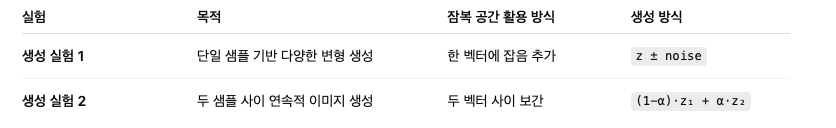

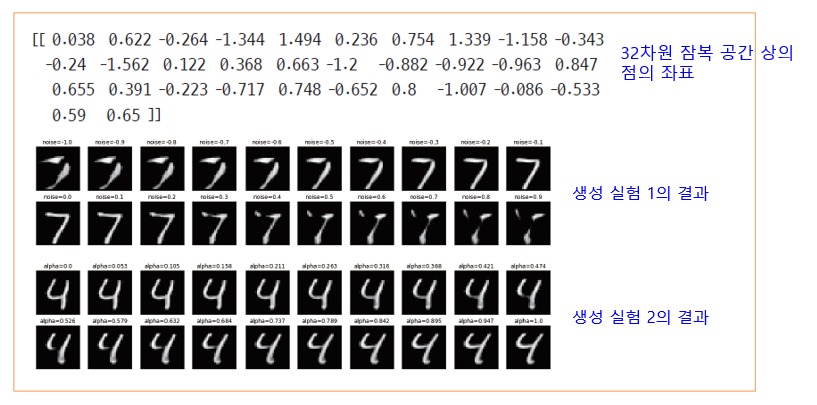

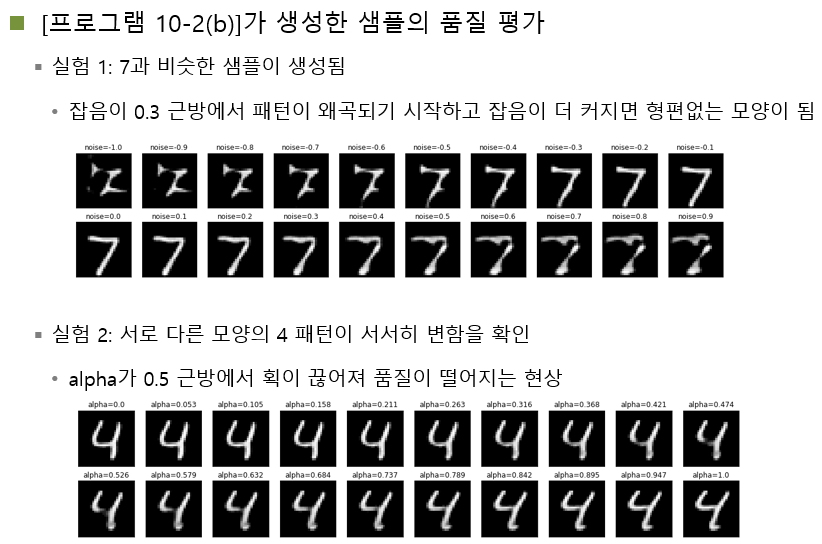

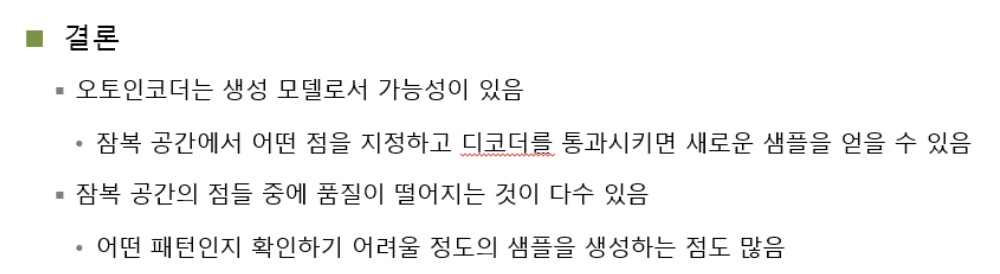

---

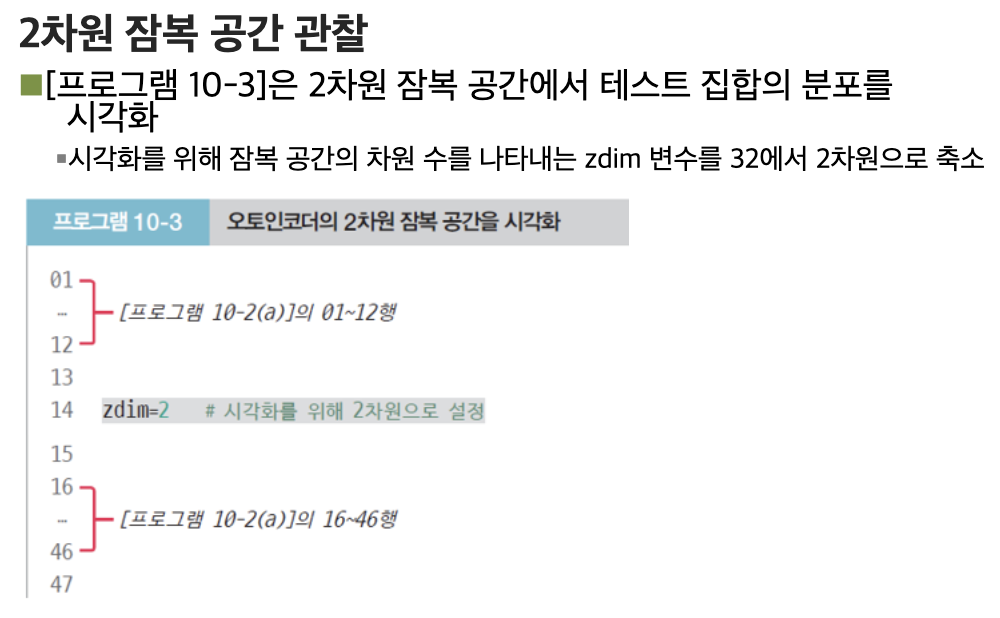

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 MNIST 숫자 이미지 데이터를 기반으로 CNN 기반 오토인코더를 학습하고,
# 잠복 공간을 2차원으로 제한하여 고차원 이미지 데이터를 시각적으로 표현 가능한 평면에 투영함.
# 이후 학습된 인코더를 이용해 테스트 이미지들을 2차원 공간에 매핑하고,
# 각 클래스별 분포가 공간상에서 어떻게 형성되는지를 산점도로 시각화함.
# 이를 통해 오토인코더가 입력 데이터의 구조를 어떻게 요약했는지를 직관적으로 파악할 수 있음.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: MNIST 데이터 로드 및 전처리 (정규화, reshape)
# 2단계: 인코더 설계 (CNN → Flatten → Dense(zdim=2))
# 3단계: 디코더 설계 (Dense → Reshape → ConvTranspose)
# 4단계: 전체 오토인코더 모델 구성 및 학습 수행
# 5단계: 복원 이미지 시각화 (원본 vs 복원)
# 6단계: 잠복 공간 분포 시각화 (2D latent scatter plot)
# ------------------------------------------------------------

import numpy as np  
# 고속 행렬 연산 및 배열 처리를 위한 핵심 수치 계산 라이브러리로, 딥러닝 입력 전처리나 벡터 연산 등에 활용됨

from tensorflow.keras.datasets import mnist  
# Keras에서 제공하는 손글씨 숫자 이미지 데이터셋(MNIST)을 불러오기 위한 모듈

from tensorflow.keras.layers import Input, Dense, Flatten, Reshape, Conv2D, Conv2DTranspose  
# 신경망 모델을 구성하기 위한 다양한 레이어를 불러옴
# Input: 입력층 정의용
# Dense: 완전 연결층
# Flatten: 다차원 텐서를 1차원 벡터로 변환
# Reshape: 벡터를 다차원 텐서로 재배열
# Conv2D: 합성곱 계층
# Conv2DTranspose: 이미지 복원을 위한 전치합성곱 계층

from tensorflow.keras.models import Model  
# 함수형 API 기반으로 입력 → 출력의 흐름을 정의할 수 있는 모델 클래스

from tensorflow.keras import backend as K  
# 텐서플로우 백엔드 연산 접근을 위한 Keras의 내부 연산 모듈

# ------------------------------------------------------------------
# MNIST 데이터를 불러와 신경망 입력 형태로 변환하는 전처리 과정
# ------------------------------------------------------------------

(x_train, y_train), (x_test, y_test) = mnist.load_data()  
# MNIST 데이터셋 로드: 총 60,000개의 학습 이미지와 10,000개의 테스트 이미지로 구성됨
# 각 이미지 크기는 28x28의 흑백(Gray scale) 정수형 이미지이며, 레이블은 0~9 사이의 정수값임

x_train = x_train.astype('float32') / 255.  
x_test = x_test.astype('float32') / 255.  
# 픽셀 값 범위를 0~255에서 0~1 사이의 실수값으로 정규화하는 단계
# 딥러닝 학습에서 입력 데이터 분포를 균일하게 맞추어 학습 안정성과 수렴 속도를 개선함

x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  
# CNN이 요구하는 입력 형태(Height, Width, Channel)로 데이터 차원을 재구성함
# MNIST는 흑백 이미지이므로 채널 수는 1이며, 총 4차원 텐서로 변환됨 (batch_size, 28, 28, 1)

zdim = 2  
# 잠복 공간(latent space)의 차원 수를 2로 설정함
# 2차원으로 설정한 이유는 이후에 잠복 공간 상의 데이터 분포를 2D 평면에서 시각화할 수 있기 때문임

# --------------------------------------------------------------
# 인코더(Encoder): 입력 이미지를 잠복 공간 벡터로 압축하는 모듈 정의
# --------------------------------------------------------------

encoder_input = Input(shape=(28, 28, 1))  
# 입력층 정의: 28x28 크기의 1채널 이미지를 입력으로 받음

x = Conv2D(32, (3, 3), activation='relu', padding='same', strides=(1, 1))(encoder_input)  
# 첫 합성곱 계층: 3x3 필터 32개를 사용하여 저수준 특징(모서리, 점 등)을 추출함
# padding='same'을 설정하여 출력 크기를 입력 크기와 동일하게 유지함
# ReLU 활성화 함수는 비선형성을 부여하여 신경망의 표현력을 높임

x = Conv2D(64, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 두 번째 합성곱 계층: stride=2 설정으로 이미지의 해상도를 1/2로 축소하면서 필터 수는 64개로 증가시킴
# 더 넓은 수용 영역을 가지며 중간 수준 특징을 학습함

x = Conv2D(64, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 세 번째 합성곱 계층: 다시 한번 다운샘플링을 통해 이미지 크기를 줄이고 깊이는 유지함
# 보다 추상적인 표현을 학습하는 과정

x = Conv2D(64, (3, 3), activation='relu', padding='same', strides=(1, 1))(x)  
# 네 번째 합성곱 계층: 다운샘플링 없이 특징을 보강하는 단계로, 깊이 있는 패턴 학습을 유도함

x = Flatten()(x)  
# 3차원 피처맵을 1차원 벡터로 평탄화하여 Dense 계층에 연결할 수 있도록 처리함

encoder_output = Dense(zdim)(x)  
# 잠복 공간 벡터로 매핑하는 완전 연결 계층
# 출력은 2차원 벡터이며, 입력 이미지를 요약한 핵심 정보를 압축한 표현임

model_encoder = Model(encoder_input, encoder_output)  
# 인코더 모델 객체 생성: 입력 → 압축된 잠복 벡터로 매핑하는 구조

model_encoder.summary()  
# 인코더 모델의 계층별 파라미터 수와 출력 형태 등을 요약 출력함

# --------------------------------------------------------------
# 디코더(Decoder): 잠복 벡터를 입력 이미지로 복원하는 모듈 정의
# --------------------------------------------------------------

decoder_input = Input(shape=(zdim,))  
# 디코더 입력: 잠복 공간의 2차원 벡터를 입력으로 받음

x = Dense(3136)(decoder_input)  
# 잠복 벡터를 다시 피처맵 크기(7x7x64)로 확장하기 위한 완전 연결 계층
# 7*7*64=3136이므로 이미지로 복원하기 위한 텐서 형태로 맞춤

x = Reshape((7, 7, 64))(x)  
# 3136차원 벡터를 다시 3차원 피처맵으로 재구성함

x = Conv2DTranspose(64, (3, 3), activation='relu', padding='same', strides=(1, 1))(x)  
# 첫 전치합성곱 계층: 해상도 유지하며 패턴을 확장함

x = Conv2DTranspose(64, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 두 번째 전치합성곱: stride=2로 업샘플링 수행, 이미지 해상도를 2배 증가시킴

x = Conv2DTranspose(32, (3, 3), activation='relu', padding='same', strides=(2, 2))(x)  
# 세 번째 전치합성곱: 해상도를 다시 2배 증가시켜 원본 이미지 크기와 유사한 크기로 복원함

x = Conv2DTranspose(1, (3, 3), activation='relu', padding='same', strides=(1, 1))(x)  
# 마지막 전치합성곱 계층: 1채널 이미지로 복원함, 출력값의 범위는 0~1에 가까움

decoder_output = x  # 최종 출력값 설정

model_decoder = Model(decoder_input, decoder_output)  
# 디코더 모델 객체 생성: 잠복 벡터 → 복원 이미지

model_decoder.summary()  
# 디코더 모델 구조 요약 출력

# --------------------------------------------------------------
# 전체 오토인코더 구성 및 학습
# --------------------------------------------------------------

model_input = encoder_input  # 전체 모델의 입력은 인코더의 입력과 동일

model_output = model_decoder(encoder_output)  
# 인코더의 출력을 디코더에 입력하여 최종 출력값을 구성함

model = Model(model_input, model_output)  
# 인코더와 디코더를 결합한 오토인코더 전체 모델 생성

model.compile(optimizer='Adam', loss='mse')  
# 모델 컴파일: Adam 옵티마이저는 빠르고 안정적인 학습을 위해 사용되며
# 손실 함수는 입력 이미지와 복원 이미지 간의 평균제곱오차(MSE)를 사용함

model.fit(
    x_train, x_train, epochs=5, batch_size=128, shuffle=True, validation_data=(x_test, x_test)
    )  
# 오토인코더 학습 수행: 입력과 출력을 동일하게 두어 복원 학습을 진행함
# 총 5에폭 동안 128개 단위로 배치를 구성하여 학습하며, 검증셋도 함께 사용함

# --------------------------------------------------------------
# 테스트 이미지에 대한 복원 결과 출력
# --------------------------------------------------------------

decoded_img = model.predict(x_test)  
# 테스트셋을 오토인코더에 입력하여 복원된 이미지를 예측함

import matplotlib.pyplot as plt  # 시각화 라이브러리 임포트

n = 10  # 비교할 이미지 개수 설정

plt.figure(figsize=(20, 4))  # 가로로 길고 세로로 짧은 출력 영역 설정

for i in range(n):
    plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28), cmap='gray')  
    # 첫 번째 행에 원본 이미지 출력
    plt.xticks([]); plt.yticks([])

    plt.subplot(2, n, i + n + 1)
    plt.imshow(decoded_img[i].reshape(28, 28), cmap='gray')  
    # 두 번째 행에 복원 이미지 출력
    plt.xticks([]); plt.yticks([])

plt.show()  
# 전체 이미지 시각화 결과 출력

# --------------------------------------------------------------
# 잠복 공간의 분포를 2차원 평면에 시각화
# --------------------------------------------------------------

n = 1000  # 시각화 대상 테스트 이미지 개수 지정

xx = x_test[0:n]  # 앞에서부터 n개 샘플 추출

z = model_encoder.predict(xx)  
# 인코더를 이용해 해당 이미지들을 잠복 공간 벡터로 변환함

sc = plt.scatter(z[:, 0], z[:, 1], s=2, c=y_test[0:n], cmap='rainbow')  
# 잠복 공간의 두 좌표(z[:,0], z[:,1])를 x-y 좌표에 배치하고, 레이블에 따라 색상을 다르게 표시함

plt.colorbar(sc)  
# 우측에 컬러바를 출력하여 색상과 실제 숫자 간의 매핑 관계를 확인 가능하게 함


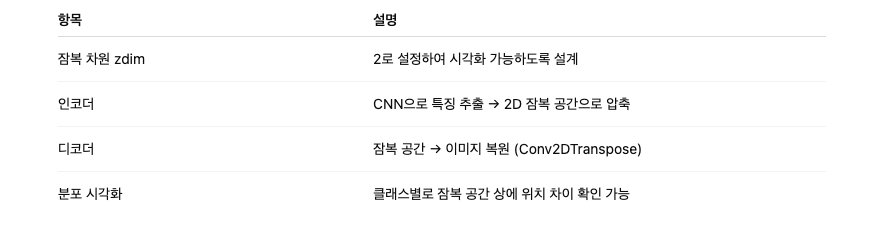

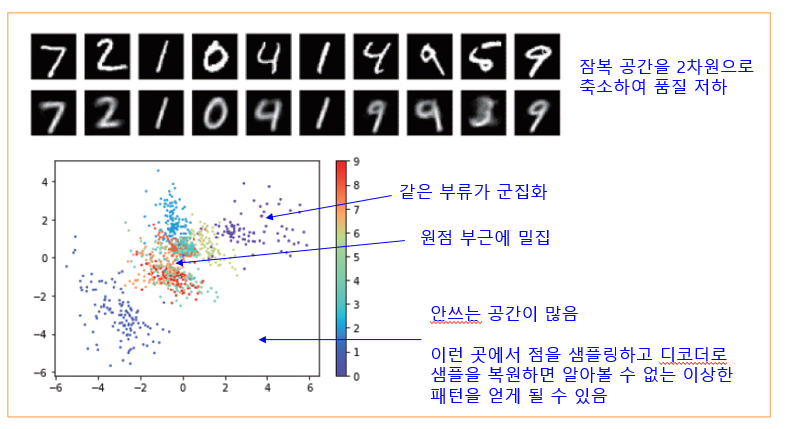

---

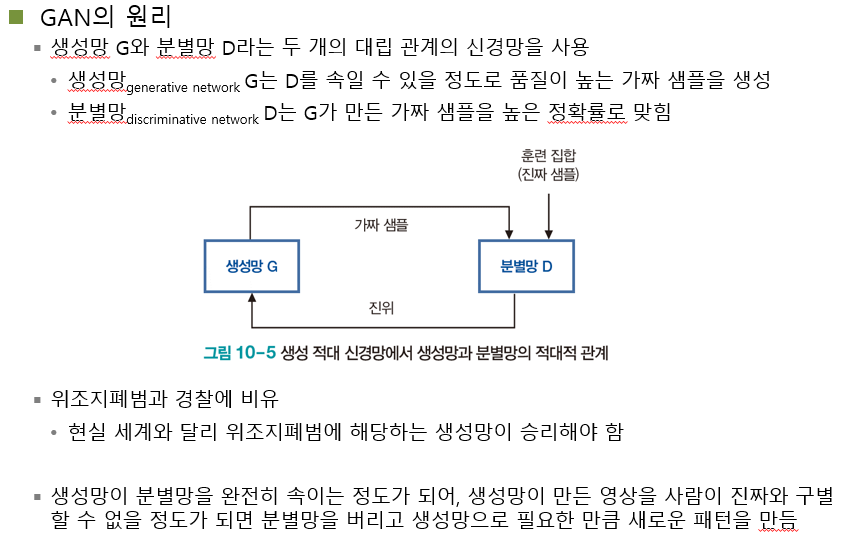

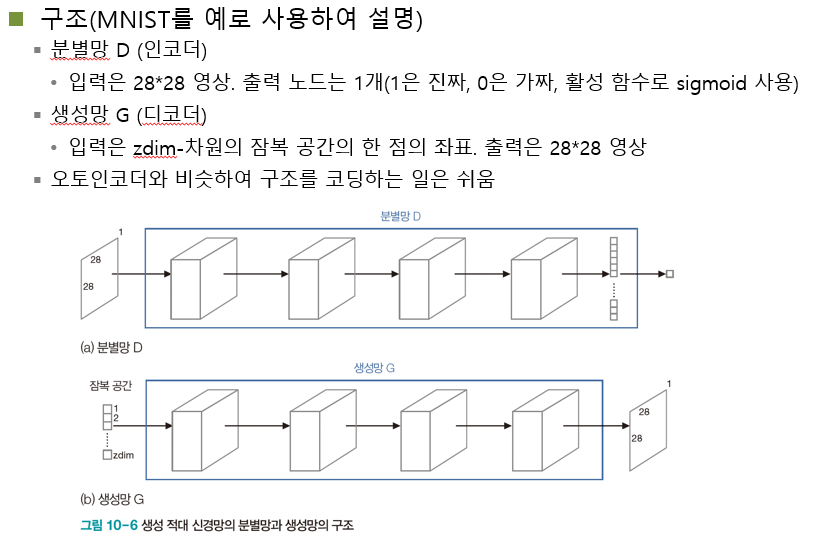

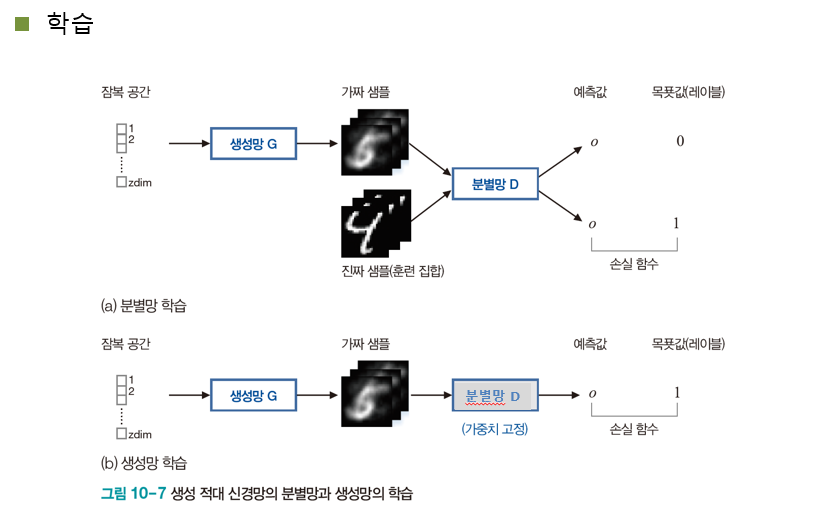

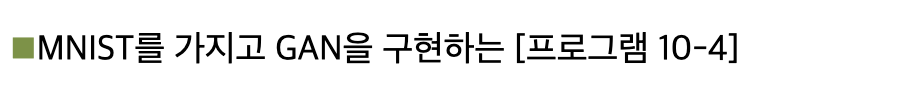

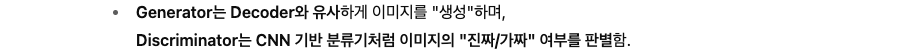

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 MNIST 숫자 이미지 생성 모델로서 DCGAN (Deep Convolutional GAN) 을 구현한 예시임.
# - Generator(생성자): 잠복 공간의 랜덤 벡터를 받아 28x28 크기의 흑백 이미지를 생성함.
# - Discriminator(판별자): 주어진 이미지가 실제 MNIST 이미지인지 생성된 가짜 이미지인지를 판별함.
# - 두 모델은 적대적(Adversarial)으로 학습되며, GAN 구조를 통해 생성자는 점차 더 실제 같은 이미지를 생성하도록 유도됨.
# - 학습 중간에 생성된 이미지들을 시각화하고, 마지막에 50장의 숫자 이미지를 생성하여 출력함.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: MNIST 데이터 로드 및 [-1, 1] 범위로 정규화 후 reshape 처리
# 2단계: 판별자 모델(Convolution 기반) 정의 및 컴파일
# 3단계: 생성자 모델(Transpose Convolution 기반) 정의
# 4단계: GAN 전체 모델 구성 (생성자 + 판별자 연결 구조)
# 5단계: 판별자와 생성자를 번갈아가며 교대로 학습 수행
# 6단계: 학습 중간 결과 시각화 및 최종 샘플 이미지 출력
# ------------------------------------------------------------

import numpy as np  
# 수치 연산을 위한 라이브러리로, 배열 처리 및 난수 생성을 위한 기능 제공

from tensorflow.keras.datasets import mnist  
# MNIST 손글씨 숫자 이미지 데이터셋을 로드하기 위한 Keras 내장 모듈

from tensorflow.keras.layers import Input, Activation, Dense, Flatten, Reshape, Conv2D, Conv2DTranspose, Dropout, BatchNormalization, UpSampling2D  
# GAN 구조 설계에 필요한 다양한 레이어 클래스들을 임포트함
# Conv2D: 합성곱 연산 수행용
# Conv2DTranspose: 업샘플링 및 이미지 복원에 사용되는 전치 합성곱 계층
# Dropout: 과적합 방지를 위한 랜덤 비활성화
# BatchNormalization: 학습 안정화를 위한 정규화 계층
# UpSampling2D: 해상도 확장을 위한 업샘플링 계층

from tensorflow.keras.models import Model  
# 함수형 API를 기반으로 입력-출력 흐름으로 모델 정의 시 사용

from tensorflow.keras import backend as K  
# Keras의 백엔드 함수 접근을 위한 인터페이스로, 저수준 연산을 지원함

from tensorflow.keras.losses import mse  
# 평균제곱오차 손실 함수 정의용 (현재 코드에선 사용하지 않음)

import matplotlib.pyplot as plt  
# 이미지 및 데이터 시각화를 위한 라이브러리

# ------------------------------------------------------------
# [1단계] 데이터 로드 및 정규화
# ------------------------------------------------------------

(x_train, y_train), (x_test, y_test) = mnist.load_data()  
# MNIST 데이터셋을 로드하여 학습용 및 테스트용 이미지와 라벨을 획득함

x_train = (x_train.astype('float32') / 255.0) * 2.0 - 1.0  
# 픽셀 값을 [0, 1] → [-1, 1] 범위로 정규화함
# 이는 tanh 출력과 일관된 분포를 만들기 위함임

x_test = (x_test.astype('float32') / 255.0) * 2.0 - 1.0  
# 테스트 이미지에도 동일한 정규화를 적용함

x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  
# 학습 이미지의 차원을 CNN 입력 형식인 (batch, height, width, channel)로 변경함

x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  
# 테스트 이미지도 동일한 형식으로 reshape 처리함

# ------------------------------------------------------------
# [2단계] 하이퍼파라미터 설정
# ------------------------------------------------------------

batch_siz = 64  # 학습 시 사용할 미니배치의 크기를 정의함

epochs = 5000  # 전체 학습 루프 반복 횟수를 정의함

dropout_rate = 0.4  # 판별자에 적용할 드롭아웃 비율을 설정함

batch_norm = 0.9  # 배치 정규화 시 사용할 모멘텀 값을 정의함

zdim = 100  # 생성자에 입력될 잠복 벡터의 차원을 설정함

# ------------------------------------------------------------
# [3단계] 판별자 모델 정의
# ------------------------------------------------------------

discriminator_input = Input(shape=(28, 28, 1))  
# 28x28 크기의 흑백 이미지를 입력으로 받는 판별자의 입력층을 정의함

x = Conv2D(64, (5, 5), activation='relu', padding='same', strides=(2, 2))(discriminator_input)  
# 첫 합성곱 계층으로, 64개의 5x5 필터를 적용하여 다운샘플링과 특징 추출을 동시에 수행함

x = Dropout(dropout_rate)(x)  
# 첫 합성곱 이후 드롭아웃을 적용하여 과적합을 방지함

x = Conv2D(64, (5, 5), activation='relu', padding='same', strides=(2, 2))(x)  
# 두 번째 합성곱 계층으로, 이미지의 크기를 1/4로 줄이고 더 추상적인 특징을 추출함

x = Dropout(dropout_rate)(x)  
# 드롭아웃을 적용하여 일반화 성능을 향상시킴

x = Conv2D(128, (5, 5), activation='relu', padding='same', strides=(2, 2))(x)  
# 세 번째 합성곱 계층으로, 더 많은 필터(128개)를 통해 고수준 특징을 추출함

x = Dropout(dropout_rate)(x)  
# 드롭아웃 적용

x = Conv2D(128, (5, 5), activation='relu', padding='same', strides=(1, 1))(x)  
# 다운샘플링 없이 동일 해상도를 유지하며 복잡도 있는 특징을 추출함

x = Dropout(dropout_rate)(x)  
# 과적합 방지를 위한 드롭아웃 적용

x = Flatten()(x)  
# 3차원 텐서를 1차원 벡터로 변환하여 Dense 계층에 전달할 수 있도록 처리함

discriminator_output = Dense(1, activation='sigmoid')(x)  
# 최종 출력 노드 1개를 사용하여 입력 이미지가 진짜인지 가짜인지 판별함

discriminator = Model(discriminator_input, discriminator_output)  
# 판별자 모델 객체를 정의함

# ------------------------------------------------------------
# [4단계] 생성자 모델 정의
# ------------------------------------------------------------

generator_input = Input(shape=(zdim,))  
# 100차원 잠복 벡터를 입력으로 받는 생성자의 입력층을 정의함

x = Dense(3136)(generator_input)  
# 완전 연결층을 통해 잠복 벡터를 7x7x64 형태의 텐서로 확장함

x = BatchNormalization(momentum=batch_norm)(x)  
# 배치 정규화를 통해 출력 분포를 일정하게 유지함

x = Activation('relu')(x)  
# 비선형 활성화로 특징 표현력을 강화함

x = Reshape((7, 7, 64))(x)  
# 완전 연결층 출력을 3차원 텐서로 재구성함

x = UpSampling2D()(x)  
# 공간 해상도를 14x14로 업샘플링함

x = Conv2D(128, (5, 5), padding='same')(x)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
# 합성곱 → 정규화 → ReLU 구조로 특징을 확대하며 안정적 학습을 유도함

x = UpSampling2D()(x)  
# 해상도를 28x28로 다시 확장함

x = Conv2D(64, (5, 5), padding='same')(x)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
# 필터 수를 줄이며 이미지의 세부 구조를 복원함

x = Conv2D(64, (5, 5), padding='same')(x)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
# 추가 합성곱으로 출력 이미지의 품질을 개선함

x = Conv2D(1, (5, 5), activation='tanh', padding='same')(x)  
# 마지막 출력층은 1채널로 구성되며, 출력 픽셀 범위를 [-1, 1]로 제한함

generator_output = x  
generator = Model(generator_input, generator_output)  
# 생성자 모델 객체를 정의함

# ------------------------------------------------------------
# [5단계] 모델 컴파일
# ------------------------------------------------------------

discriminator.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])  
# 판별자 모델은 이진 분류이므로 binary_crossentropy 손실을 사용함

discriminator.trainable = False  
# GAN 모델 학습 시 판별자의 가중치를 고정하여 생성자만 학습되도록 설정함

gan_input = Input(shape=(zdim,))  
gan_output = discriminator(generator(gan_input))  
gan = Model(gan_input, gan_output)  
# 전체 GAN 모델은 생성자 → 판별자 구조로 연결됨

gan.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])  
# 생성자 학습을 위한 GAN 모델은 동일한 손실 함수를 사용함

# ------------------------------------------------------------
# [6단계] 훈련 함수 정의
# ------------------------------------------------------------

def train_discriminator(x_train):
    c = np.random.randint(0, x_train.shape[0], batch_siz)  
    real = x_train[c]  
    # 학습 데이터에서 실제 이미지를 무작위로 추출함
    discriminator.train_on_batch(real, np.ones((batch_siz, 1)))  
    # 진짜 이미지에 대해 레이블 1로 학습시킴

    p = np.random.normal(0, 1, (batch_siz, zdim))  
    fake = generator.predict(p)  
    # 잠복 공간에서 가짜 이미지를 생성함
    discriminator.train_on_batch(fake, np.zeros((batch_siz, 1)))  
    # 가짜 이미지에 대해 레이블 0으로 학습시킴

def train_generator():
    p = np.random.normal(0, 1, (batch_siz, zdim))  
    gan.train_on_batch(p, np.ones((batch_siz, 1)))  
    # 생성자를 학습시키기 위해 생성된 이미지를 '진짜'로 분류하도록 학습함

# ------------------------------------------------------------
# [7단계] 학습 루프 및 중간 시각화
# ------------------------------------------------------------

for i in range(epochs + 1):  
    train_discriminator(x_train)  # 판별자 먼저 훈련
    train_generator()  # 생성자 훈련

    if (i % 100 == 0):  
        # 100 에폭마다 생성 이미지 시각화
        plt.figure(figsize=(20, 4))
        plt.suptitle('epoch ' + str(i))
        for k in range(20):
            plt.subplot(2, 10, k + 1)
            img = generator.predict(np.random.normal(0, 1, (1, zdim)))
            plt.imshow(img[0].reshape(28, 28), cmap='gray')
            plt.xticks([]); plt.yticks([])
        plt.show()

# ------------------------------------------------------------
# [8단계] 최종 샘플 생성 및 출력
# ------------------------------------------------------------

imgs = generator.predict(np.random.normal(0, 1, (50, zdim)))  
# 학습 완료 후 50개의 무작위 잠복 벡터를 통해 이미지 생성

plt.figure(figsize=(20, 10))  
for i in range(50):
    plt.subplot(5, 10, i + 1)
    plt.imshow(imgs[i].reshape(28, 28), cmap='gray')
    plt.xticks([]); plt.yticks([])  
# 총 50장의 생성된 숫자 이미지를 5행 10열로 시각화 출력


In [ ]:
# 코드 결과 ================================================================================

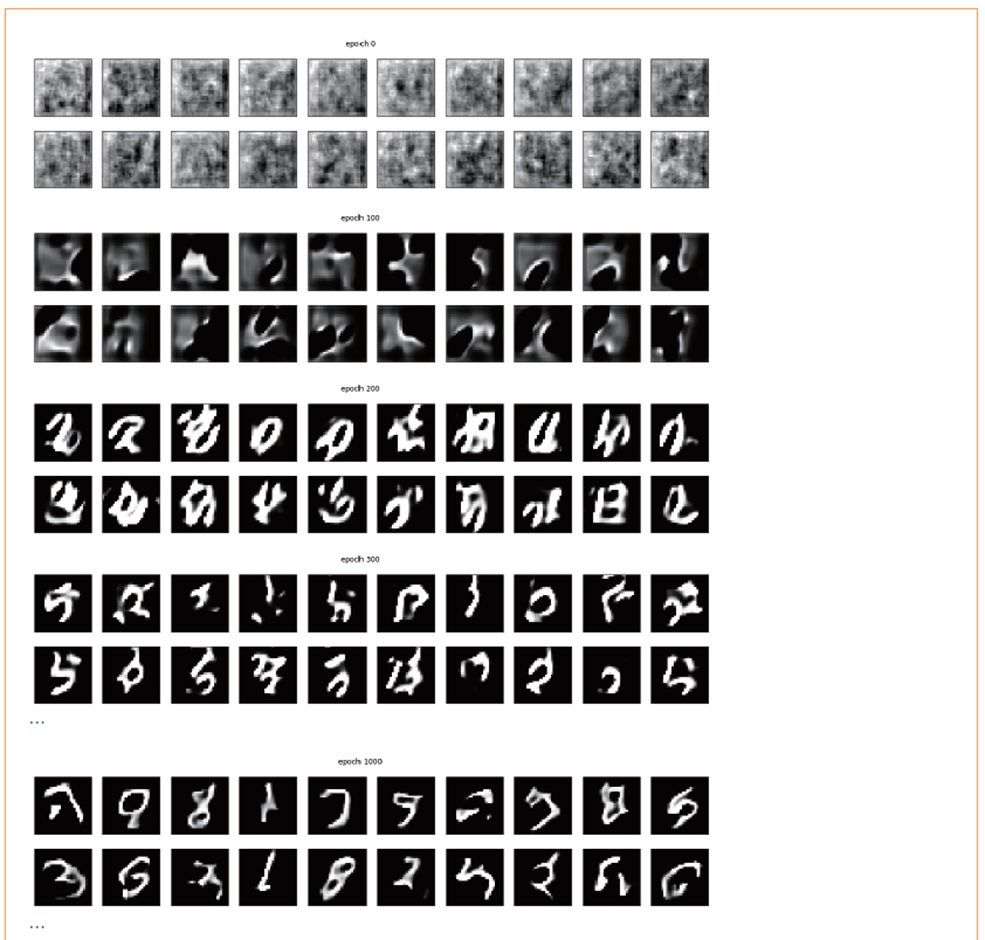

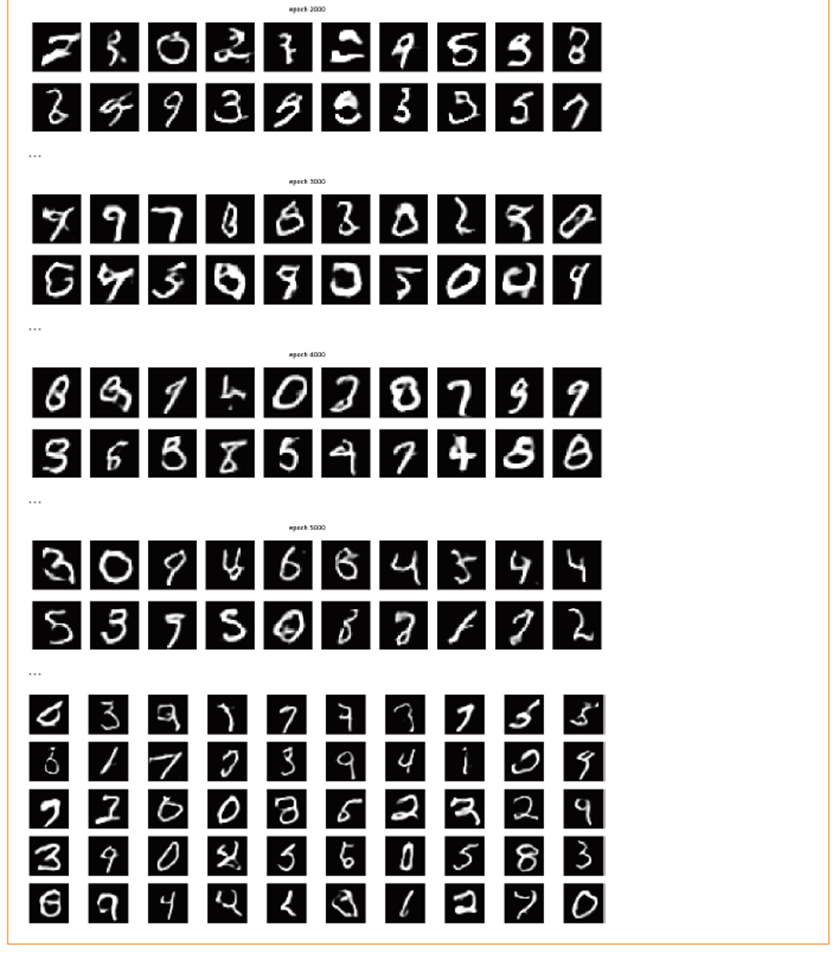

In [ ]:
# Discriminator 모델 요약================================================================================

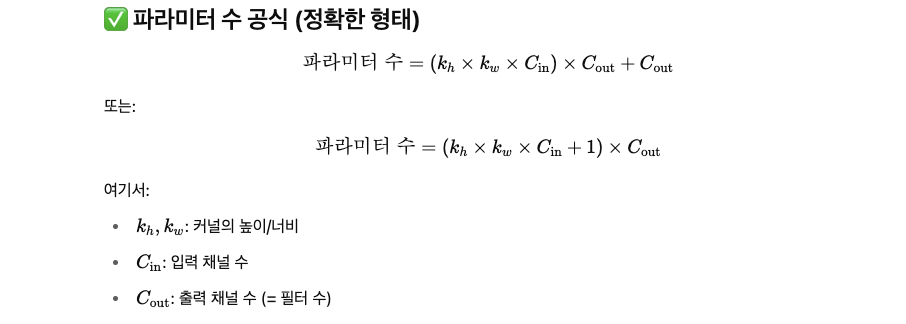

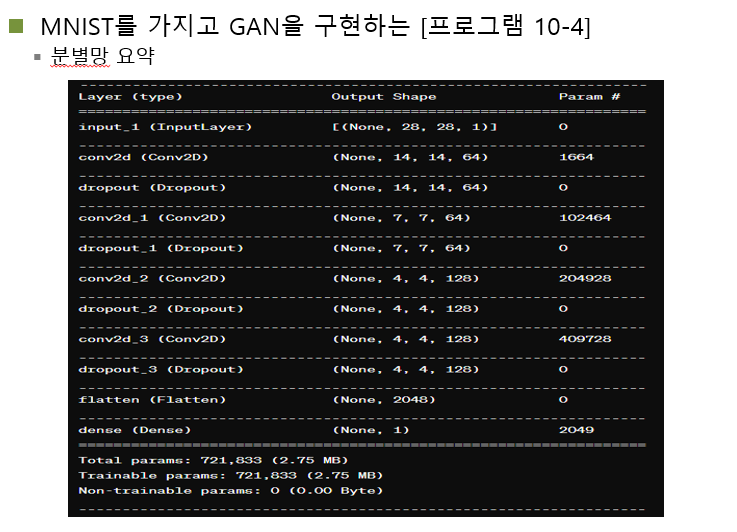

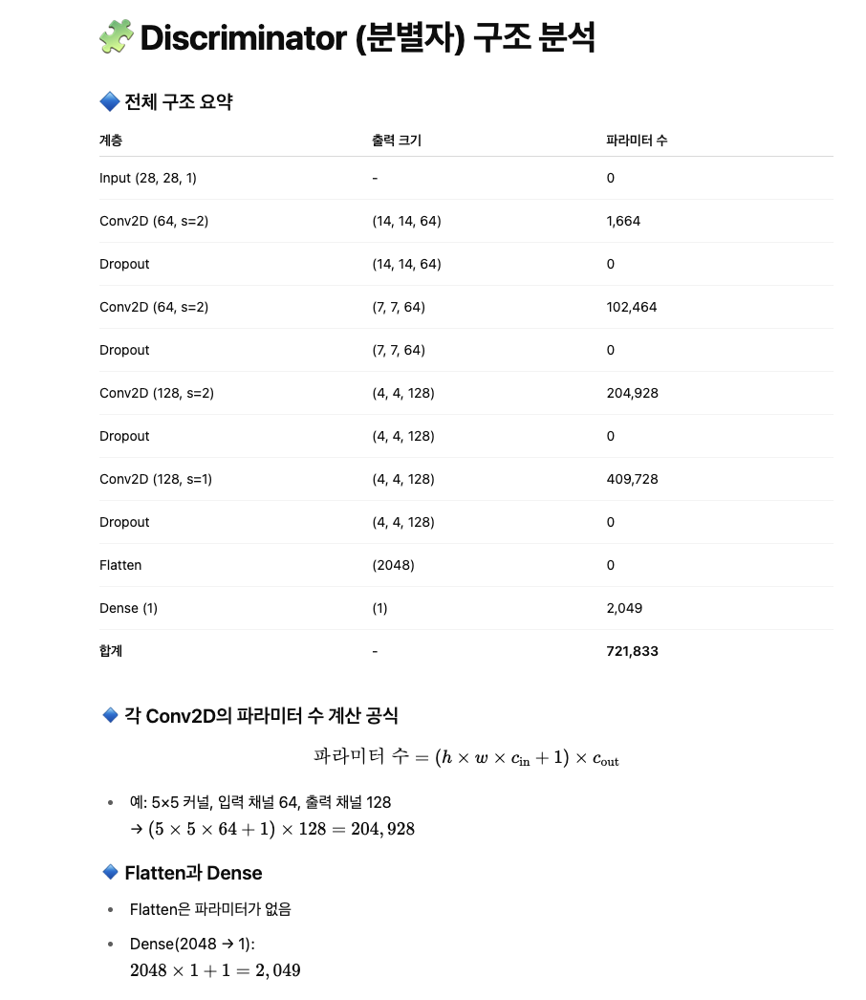

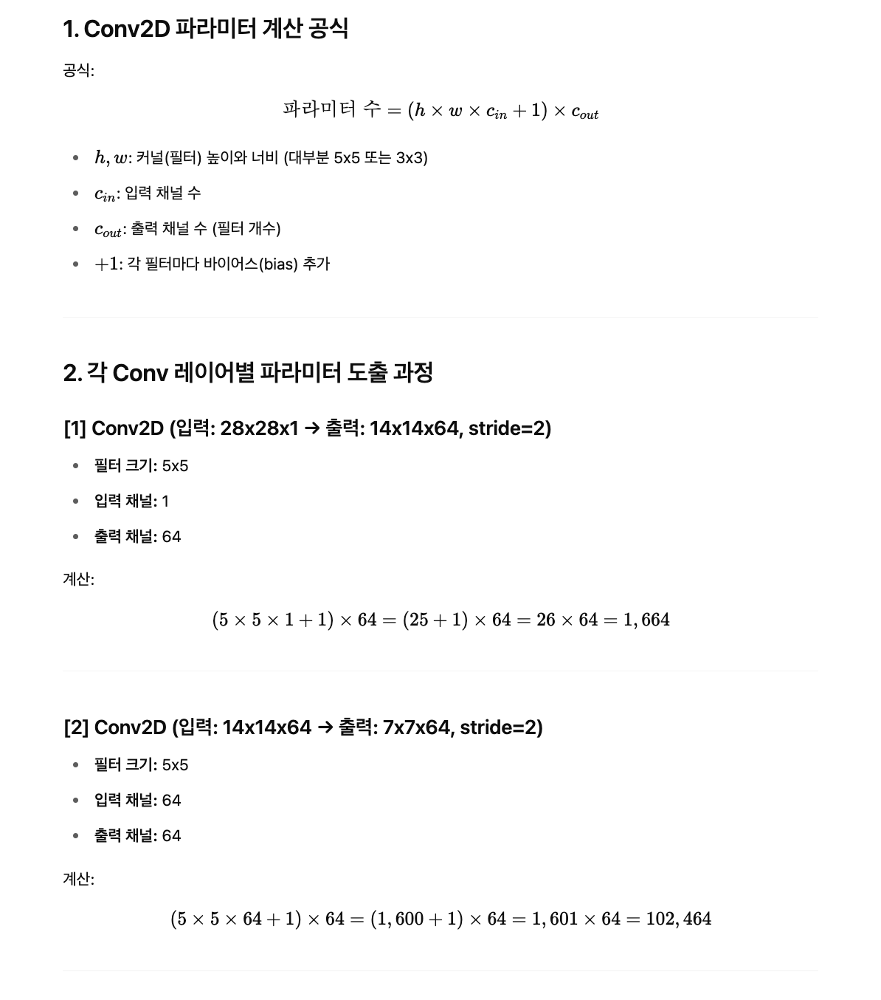

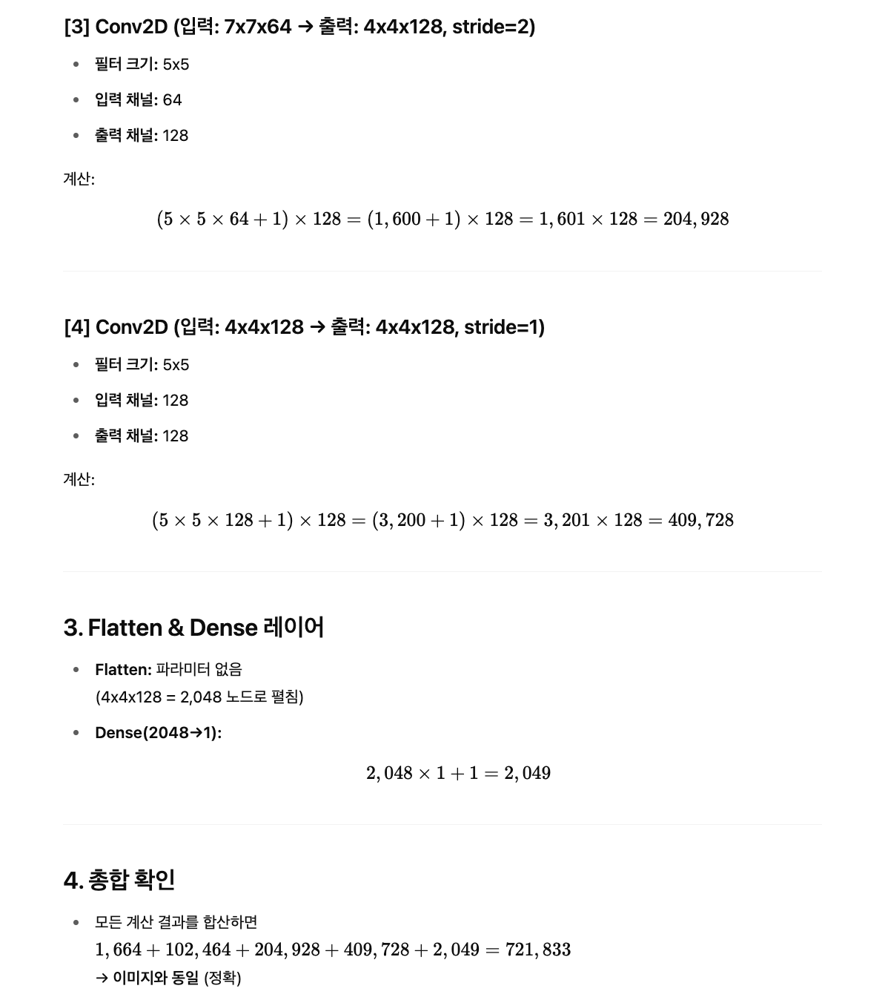

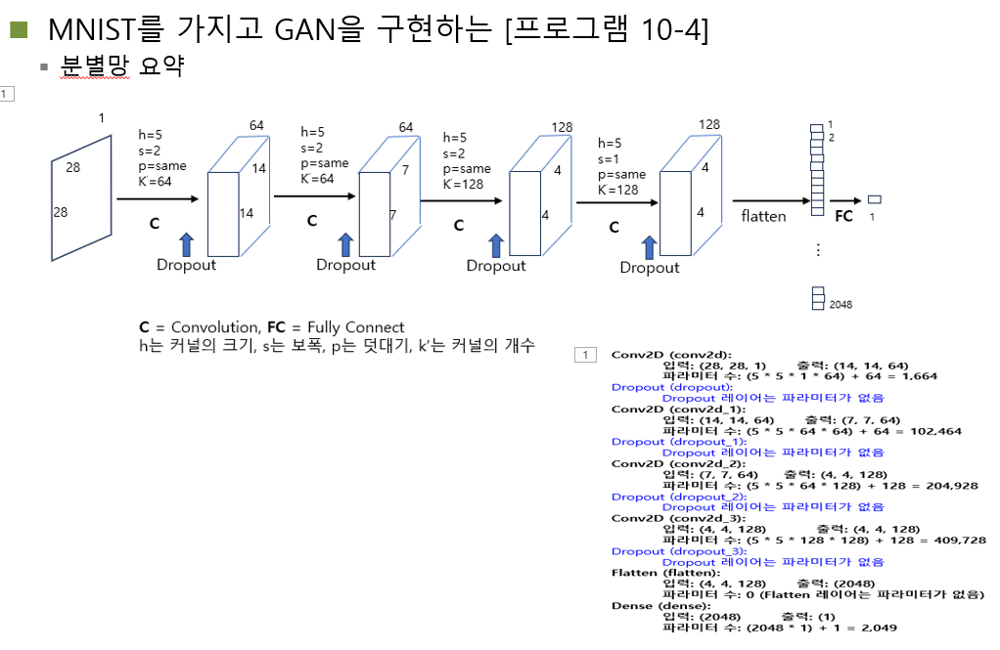

In [ ]:
# Generator 모델 요약================================================================================

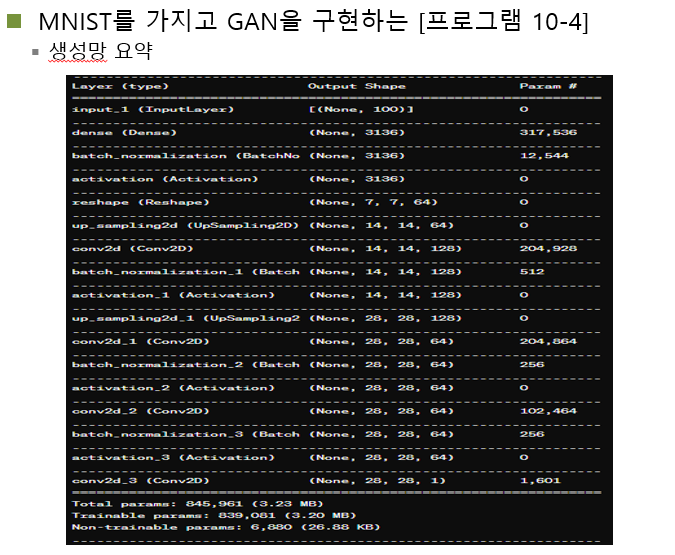

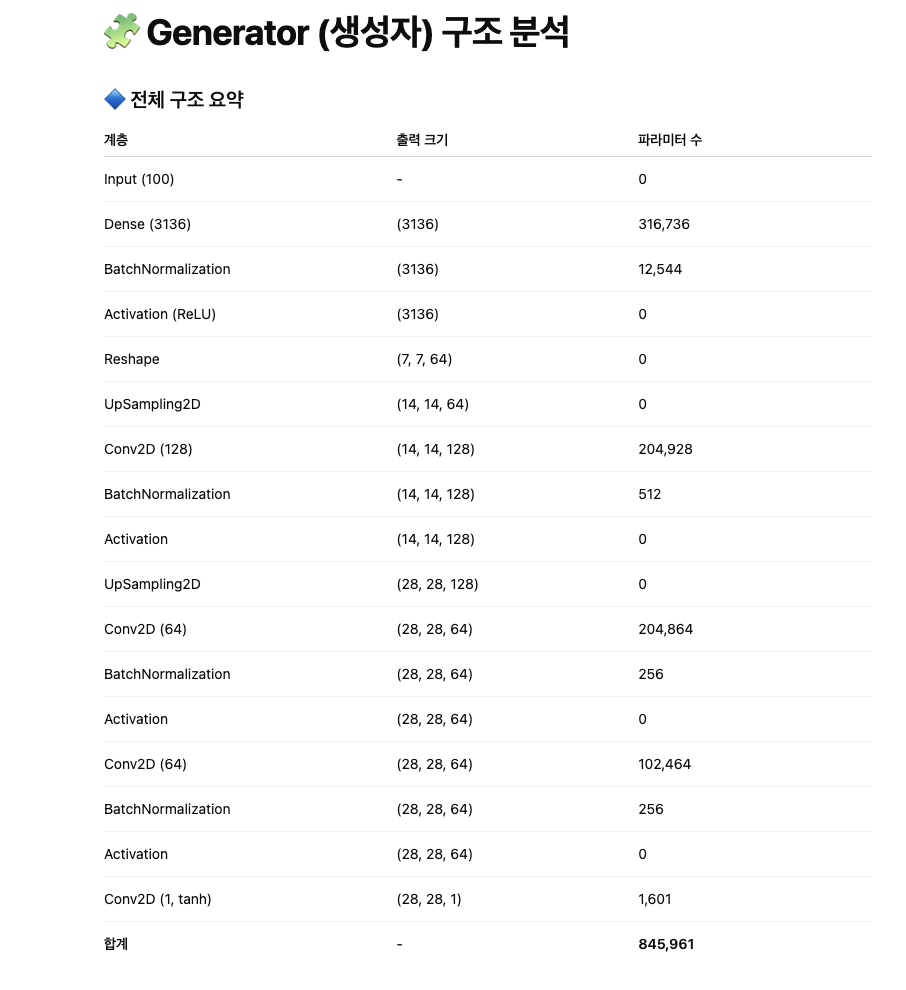

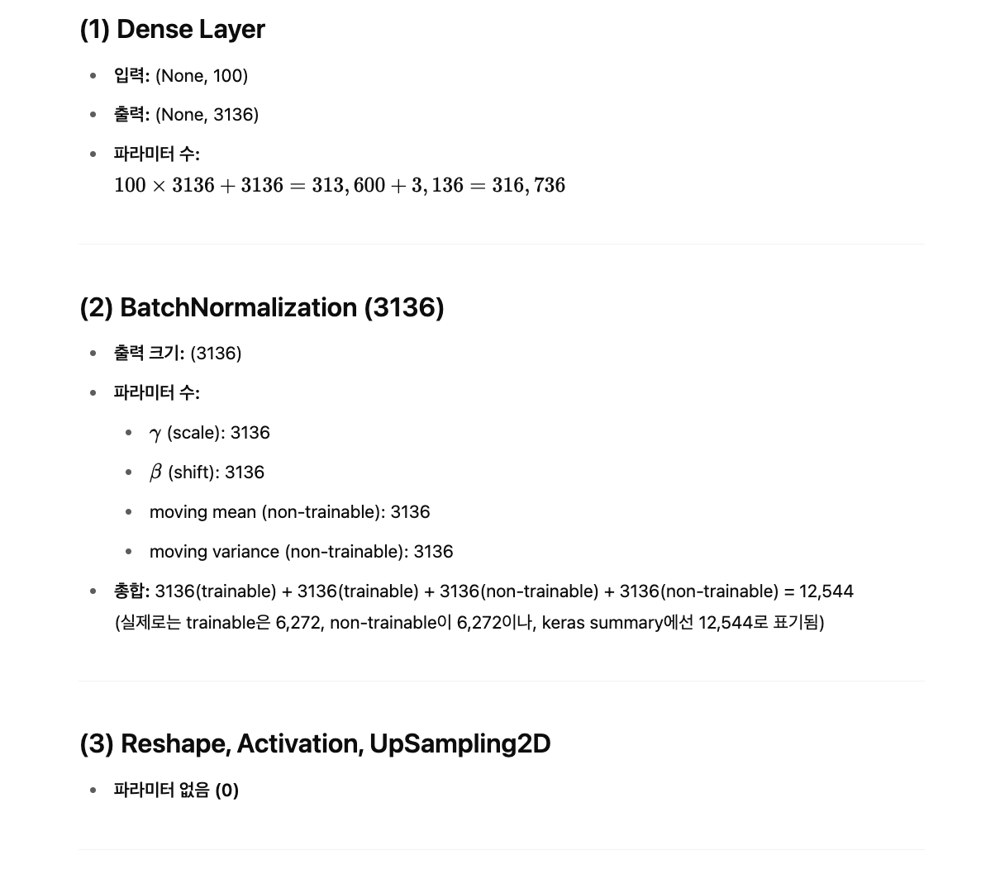

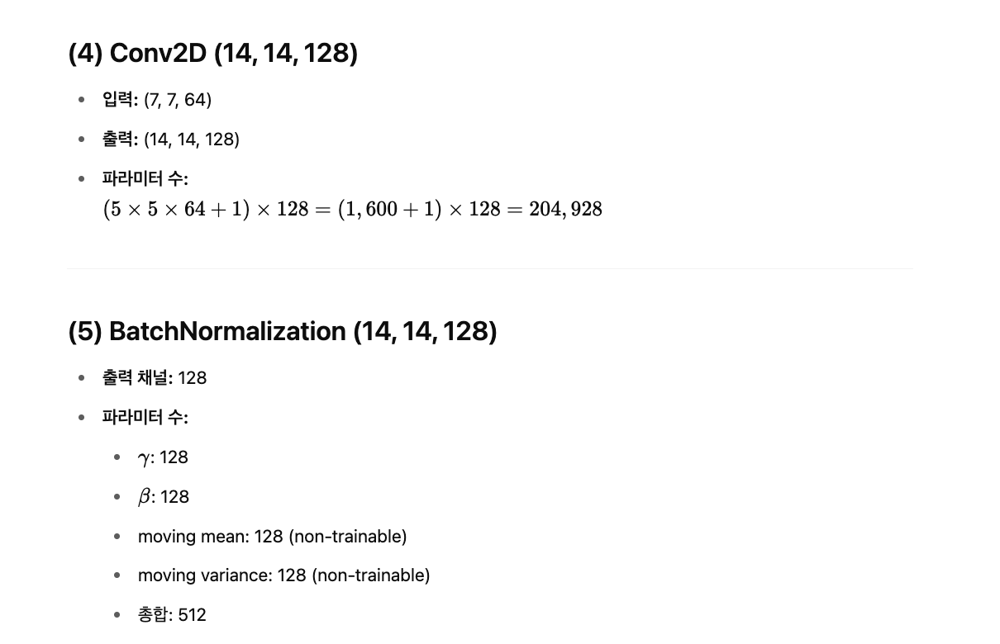

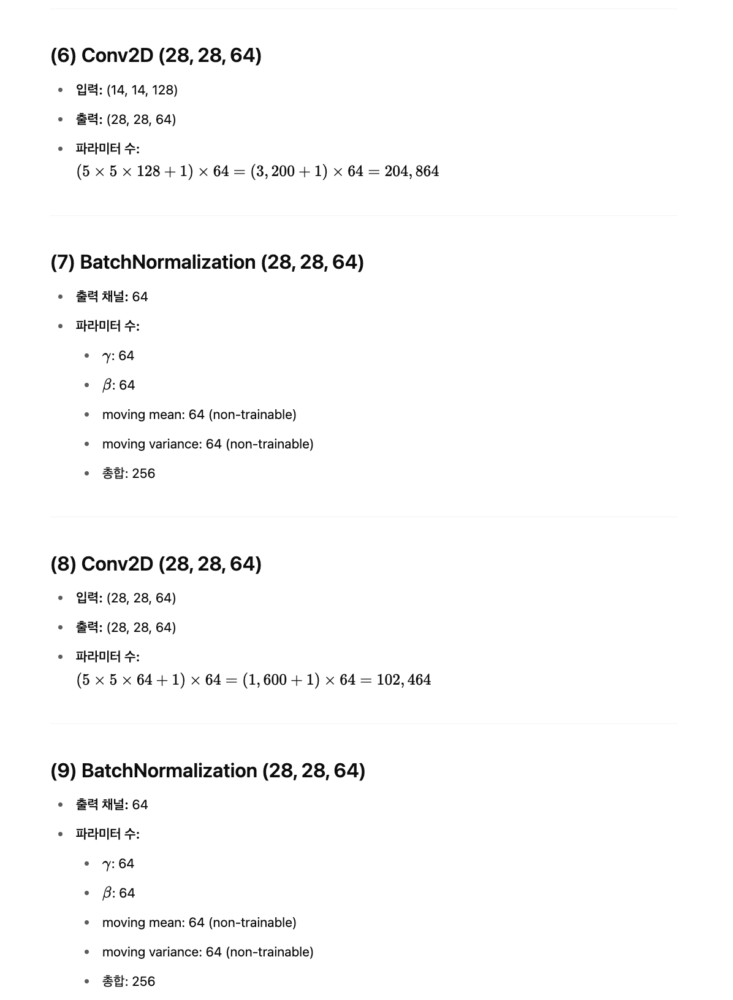

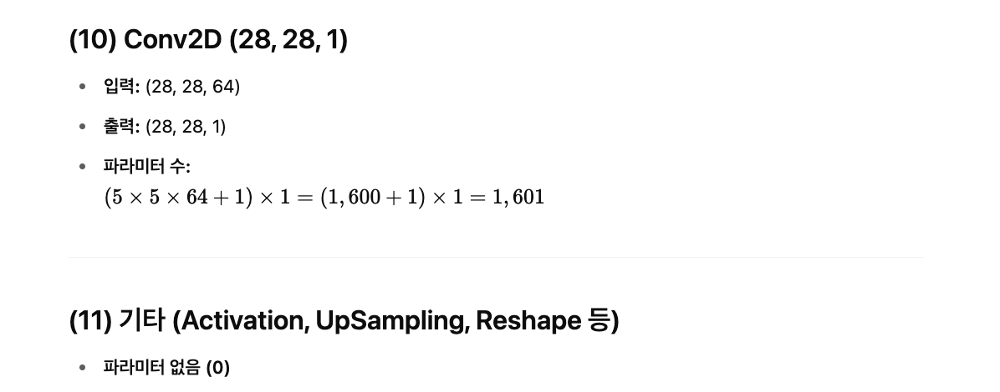

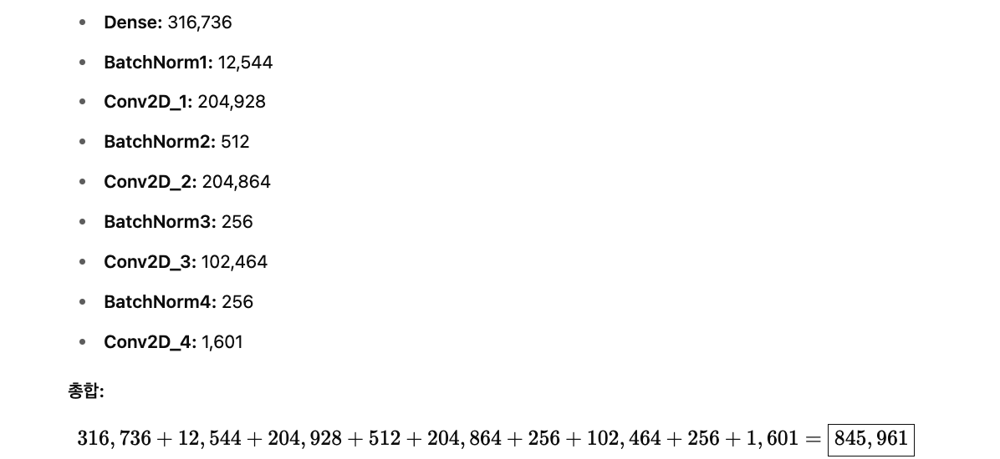

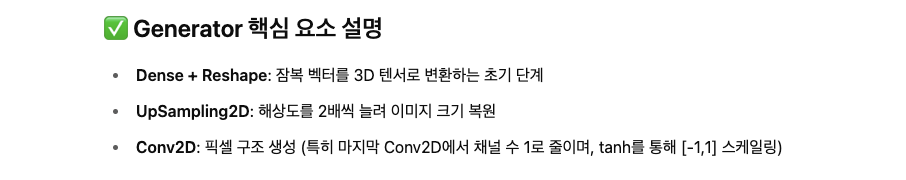

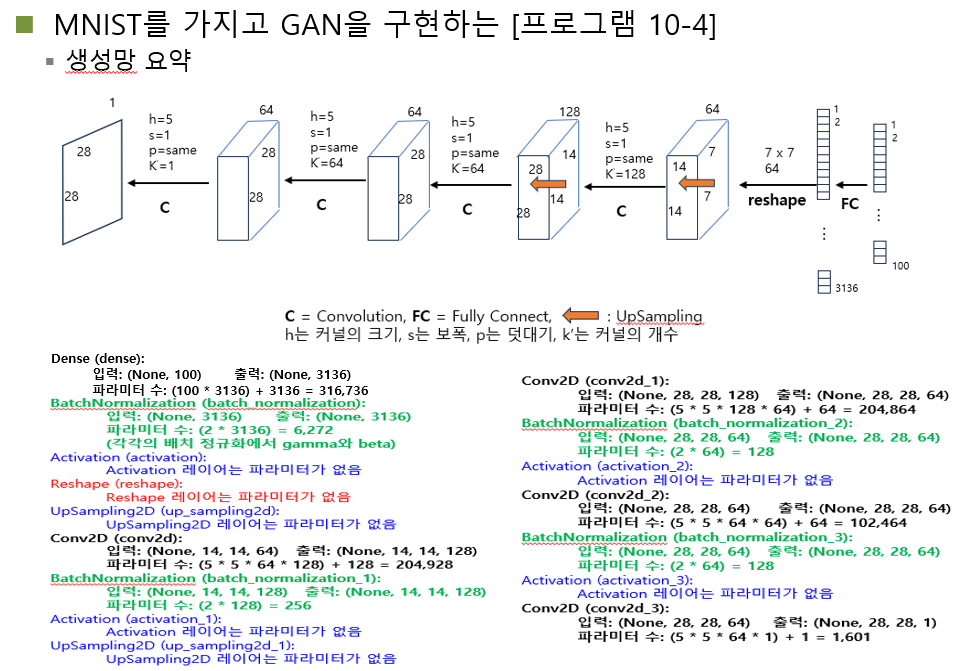

---

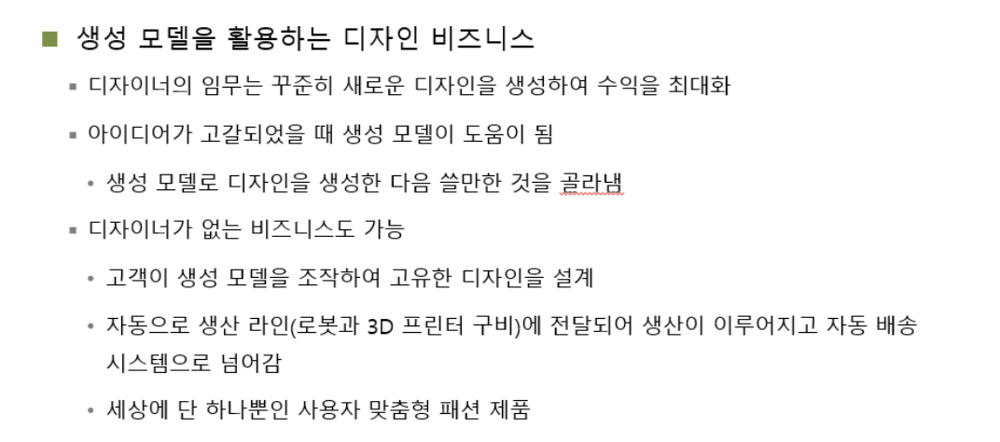

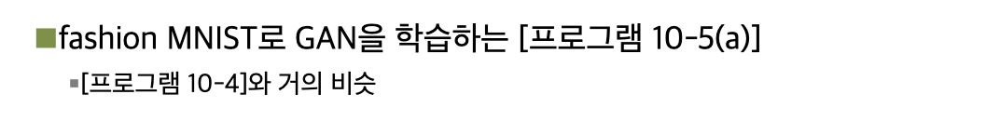

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 Fashion-MNIST 데이터셋의 ankle boot(9번 클래스) 이미지를 학습 대상으로 하는 DCGAN 모델임.
# - 생성자(Generator): 랜덤 잠복 벡터(zdim=100)를 받아 28x28 크기의 ankle boot 이미지를 생성함.
# - 판별자(Discriminator): 주어진 이미지가 실제 ankle boot 이미지인지 생성된 가짜 ankle boot 이미지인지 판별함.
# - 두 네트워크는 적대적으로 학습되며, 생성자는 점차 더 진짜 같은 부츠 이미지를 생성하도록 진화함.
# - 학습 중간에 생성된 이미지를 시각화하고, 최종적으로 50장의 부츠 샘플 이미지를 출력함.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: Fashion-MNIST 로드 → ankle boot(클래스 9)만 필터링 → 정규화 및 reshape
# 2단계: 하이퍼파라미터 정의 (batch_size, epochs, zdim 등)
# 3단계: 판별자 모델 구성 및 컴파일
# 4단계: 생성자 모델 구성
# 5단계: 전체 GAN 모델(생성자+판별자 결합) 구성 및 컴파일
# 6단계: 학습 루프 구성
# 7단계: 판별자 → 생성자 순으로 교대로 학습 - 100에폭마다 샘플 시각화, 학습 종료 후 50장 이미지 출력
# ------------------------------------------------------------

iimport numpy as np  # 배열 기반 고속 수치 계산을 위한 라이브러리

from tensorflow.keras.datasets import fashion_mnist  # 패션 아이템 이미지 데이터셋 로드용 모듈

from tensorflow.keras.layers import Input, Activation, Dense, Flatten, Reshape, Conv2D, Conv2DTranspose, Dropout, BatchNormalization, UpSampling2D, LeakyReLU  
# GAN 구성에 필요한 CNN 레이어들과 정규화/드롭아웃/활성화 함수 정의용 레이어들

from tensorflow.keras.models import Model  # 함수형 API 기반으로 모델 구성 시 사용

from tensorflow.keras import backend as K  # 텐서플로우 백엔드 함수 접근 인터페이스

from tensorflow.keras.losses import mse  # 평균 제곱 오차 손실 함수 모듈 (미사용)

import matplotlib.pyplot as plt  # 시각화용 플롯 라이브러리

# ------------------------------------------------------------
# [1단계] 데이터 로드 및 ankle boot 필터링
# ------------------------------------------------------------

(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()  
# Fashion-MNIST 데이터셋 로드 (28x28 흑백 이미지, 10개 클래스 포함)

x_train = x_train[np.isin(y_train, [9])]  
# 9번 클래스 (ankle boot)만 필터링하여 생성 대상 클래스로 한정함

x_train = (x_train.astype('float32') / 255.0) * 2.0 - 1.0  
# 픽셀 값을 [0, 1] 범위에서 [-1, 1] 범위로 정규화함 (tanh 출력 범위와 맞춤)

x_test = (x_test.astype('float32') / 255.0) * 2.0 - 1.0  
# 테스트셋도 동일하게 정규화 수행함 (테스트셋은 사용되지 않음)

x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  
# 학습 데이터를 CNN 입력 형식인 (28,28,1)로 재구성함

x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  
# 테스트셋도 동일한 차원으로 reshape 수행함

# ------------------------------------------------------------
# [2단계] 하이퍼파라미터 설정
# ------------------------------------------------------------

batch_siz = 64  # 배치당 샘플 수 정의

epochs = 5000  # 학습 반복 횟수 정의

dropout_rate = 0.4  # 판별자 내 드롭아웃 적용 비율 정의

batch_norm = 0.9  # 배치 정규화 모멘텀 설정

zdim = 100  # 잠복 공간 차원 수 설정

# ------------------------------------------------------------
# [3단계] 판별자(Discriminator) 구성
# ------------------------------------------------------------

discriminator_input = Input(shape=(28, 28, 1))  
# 입력 이미지 크기를 (28x28x1)로 정의한 입력층 구성

x = Conv2D(64, (5, 5), activation='relu', padding='same', strides=(2, 2))(discriminator_input)  
# 첫 합성곱 계층: 64개의 5x5 필터, 2배 다운샘플링

x = Dropout(dropout_rate)(x)  
# 과적합 방지를 위한 드롭아웃 적용

x = Conv2D(64, (5, 5), activation='relu', padding='same', strides=(2, 2))(x)  
x = Dropout(dropout_rate)(x)  
# 두 번째 합성곱 및 드롭아웃 반복 적용

x = Conv2D(128, (5, 5), activation='relu', padding='same', strides=(2, 2))(x)  
x = Dropout(dropout_rate)(x)  
# 깊이를 늘리며 고수준 특징을 학습함

x = Conv2D(128, (5, 5), activation='relu', padding='same', strides=(1, 1))(x)  
x = Dropout(dropout_rate)(x)  
# 다운샘플링 없이 특징 강화 후 드롭아웃 적용

x = Flatten()(x)  
# 3차원 피처맵을 1차원 벡터로 평탄화

discriminator_output = Dense(1, activation='sigmoid')(x)  
# 이진 분류용 출력층 구성 (진짜 vs 가짜 판별)

discriminator = Model(discriminator_input, discriminator_output)  
# 판별자 모델 객체 생성

# ------------------------------------------------------------
# [4단계] 생성자(Generator) 구성
# ------------------------------------------------------------

generator_input = Input(shape=(zdim,))  
# 잠복 공간 벡터 z(100차원)를 입력으로 받는 입력층 정의

x = Dense(3136)(generator_input)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
x = Reshape((7, 7, 64))(x)  
# z를 7x7x64 텐서로 확장하여 2D 형태로 변환

x = UpSampling2D()(x)  
# 7x7 → 14x14로 해상도 확장

x = Conv2D(128, (5, 5), padding='same')(x)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
# 업샘플 후 특징 추출 및 정규화

x = UpSampling2D()(x)  
# 14x14 → 28x28로 해상도 확장

x = Conv2D(64, (5, 5), padding='same')(x)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
# 복원된 해상도에서 세부 특징 생성

x = Conv2D(64, (5, 5), padding='same')(x)  
x = BatchNormalization(momentum=batch_norm)(x)  
x = Activation('relu')(x)  
# 추가 합성곱으로 디테일 복원 강화

x = Conv2D(1, (5, 5), activation='tanh', padding='same')(x)  
# 최종 출력층: 채널 수 1, tanh 활성화로 [-1,1] 범위 생성

generator_output = x  
generator = Model(generator_input, generator_output)  
# 생성자 모델 객체 정의

# ------------------------------------------------------------
# [5단계] 모델 컴파일 및 연결
# ------------------------------------------------------------

discriminator.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])  
# 판별자 모델 컴파일: 이진 분류 손실 및 정확도 지표 사용

discriminator.trainable = False  
# 생성자 학습 시 판별자의 가중치를 고정함

gan_input = Input(shape=(zdim,))  
gan_output = discriminator(generator(gan_input))  
gan = Model(gan_input, gan_output)  
# 전체 GAN 구성: 생성자 → 판별자 연결

gan.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])  
# 전체 모델(생성자 학습용) 컴파일

# ------------------------------------------------------------
# [6단계] 훈련 함수 정의
# ------------------------------------------------------------

def train_discriminator(x_train):
    c = np.random.randint(0, x_train.shape[0], batch_siz)  
    real = x_train[c]  
    # 실제 ankle boot 이미지 샘플 추출

    discriminator.train_on_batch(real, np.ones((batch_siz, 1)))  
    # 진짜 이미지에 대해 레이블 1로 훈련

    p = np.random.normal(0, 1, (batch_siz, zdim))  
    fake = generator.predict(p)  
    # 가짜 이미지 생성

    discriminator.train_on_batch(fake, np.zeros((batch_siz, 1)))  
    # 가짜 이미지에 대해 레이블 0으로 훈련

def train_generator():
    p = np.random.normal(0, 1, (batch_siz, zdim))  
    gan.train_on_batch(p, np.ones((batch_siz, 1)))  
    # 생성자가 생성한 이미지를 판별자가 진짜로 분류하도록 유도함

# ------------------------------------------------------------
# [7단계] 학습 루프 및 시각화
# ------------------------------------------------------------

for i in range(epochs + 1):
    train_discriminator(x_train)  # 판별자 먼저 학습
    train_generator()  # 생성자 학습

    if i % 100 == 0:
        # 중간 결과 시각화
        plt.figure(figsize=(20, 4))
        plt.suptitle('epoch ' + str(i))
        for k in range(20):
            plt.subplot(2, 10, k + 1)
            img = generator.predict(np.random.normal(0, 1, (1, zdim)))
            plt.imshow(img[0].reshape(28, 28), cmap='gray')
            plt.xticks([]); plt.yticks([])
        plt.show()

# ------------------------------------------------------------
# [8단계] 최종 샘플 출력
# ------------------------------------------------------------

imgs = generator.predict(np.random.normal(0, 1, (50, zdim)))  
# 학습 완료된 생성자를 이용하여 50개의 ankle boot 이미지 생성

plt.figure(figsize=(20, 10))  
# 시각화 캔버스 크기 설정

for i in range(50):
    plt.subplot(5, 10, i + 1)
    plt.imshow(imgs[i].reshape(28, 28), cmap='gray')
    plt.xticks([]); plt.yticks([])  
# 5행 10열 구성으로 생성된 이미지 출력



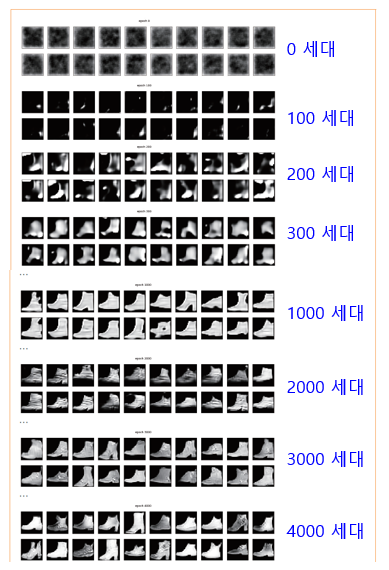

---

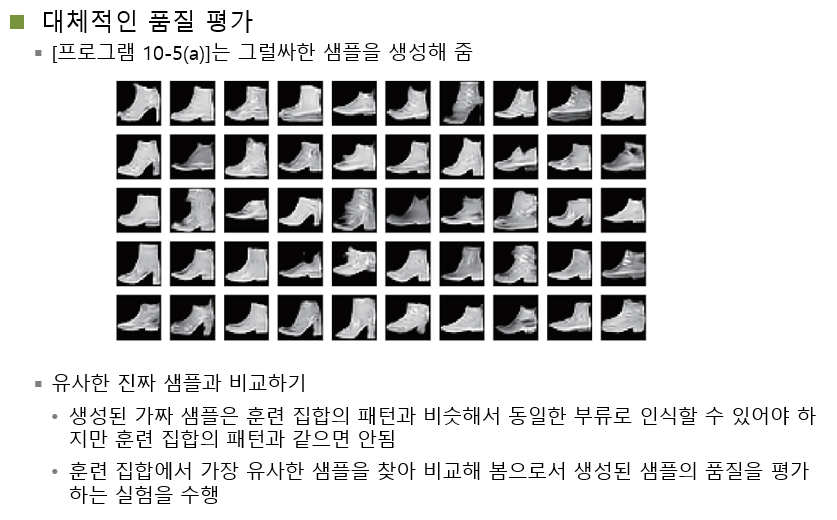
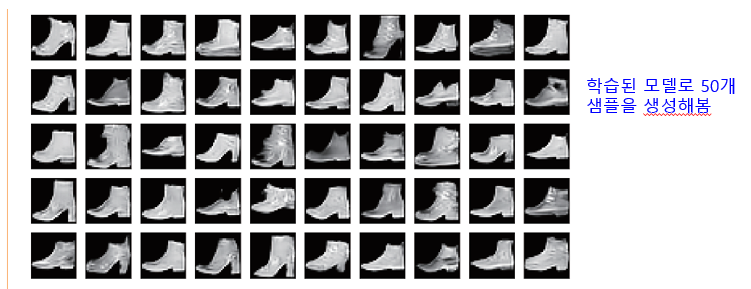

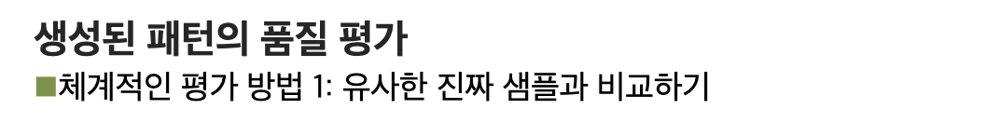

In [ ]:
# ------------------------------------------------------------
# [전체 개요: Overview]
# 본 코드는 GAN이 생성한 50장의 이미지 각각에 대해,
# 학습 데이터셋 x_train 내에서 가장 유사한 원본 이미지를 찾아 시각화하는 과정임.
# 유사도는 L1 거리(절대 오차의 평균) 를 기준으로 측정하며,
# 생성 이미지와 가장 가까운 실제 ankle boot 이미지를 대응시켜 비교할 수 있음.
# 이를 통해 생성된 이미지가 학습 데이터의 단순 복사인지, 혹은 일반화된 생성인지 분석할 수 있음.
# ------------------------------------------------------------
# ------------------------------------------------------------
# [처리 흐름: Step-by-step Flow]
# 1단계: most_similar() 함수 정의 – 입력 이미지와 가장 유사한 학습 이미지 반환
# 2단계: 50장의 생성 이미지 각각에 대해 가장 유사한 원본 이미지 탐색
# 3단계: 유사한 원본 이미지 50장을 5행 10열로 시각화 출력
# ------------------------------------------------------------

# 훈련 집합 x_train에서 img와 가장 가까운 영상을 찾아주는 함수
def most_similar(img, x_train):
    vmin = 1.0e10  
    # 최소 거리 초기값을 매우 큰 값으로 설정하여 첫 비교값이 무조건 작게 만들도록 유도함

    for i in range(len(x_train)):  
        # 전체 학습 데이터셋을 순회하며 생성 이미지와 유사도를 비교함

        dist = np.mean(np.abs(img - x_train[i]))  
        # L1 거리: 두 이미지 간 픽셀의 절대값 차이의 평균을 유사도 척도로 사용함

        if dist < vmin:
            imin, vmin = i, dist  
            # 현재까지의 최소 거리보다 작은 경우, 그 인덱스와 값을 저장함

    return x_train[imin]  
    # 최소 거리로 판별된 학습 이미지 한 장을 반환함

# 50개의 생성 이미지에 대해 가장 유사한 학습 이미지 50장을 시각화 출력
plt.figure(figsize=(20, 10))  
# 출력 캔버스를 넓게 설정하여 5행 10열 구조로 출력할 수 있도록 공간 확보

for k in range(50):
    plt.subplot(5, 10, k + 1)  
    # 5행 10열 중 k+1번째 위치에 subplot을 배치함

    plt.imshow(most_similar(imgs[k], x_train).reshape(28, 28), cmap='gray')  
    # 각 생성 이미지에 대해 가장 유사한 학습 이미지를 찾아 시각화함
    # 반환된 이미지를 28x28로 reshape 후 회색조로 출력함

    plt.xticks([]); plt.yticks([])  
    # 눈금 제거로 출력 이미지만 선명하게 보이도록 설정함

plt.show()  
# 전체 시각화 결과를 출력함


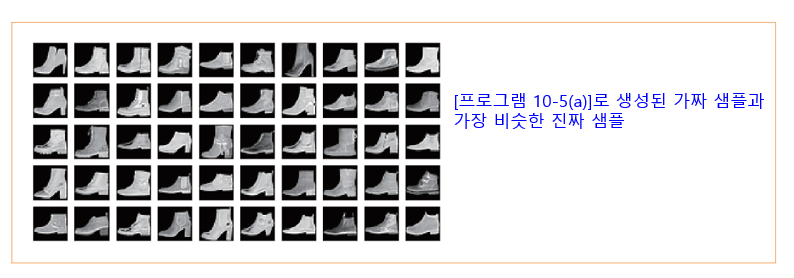

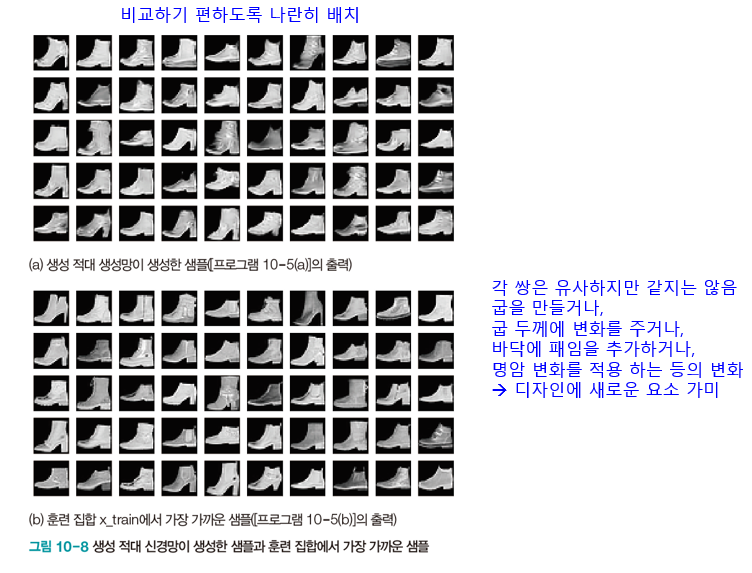